In [73]:
import numpy as np
  
from keras.models import Model, Sequential
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Conv2DTranspose, GlobalAveragePooling2D, GlobalMaxPooling2D
from keras.layers import concatenate, LeakyReLU, BatchNormalization, Dense, Flatten, Activation, Reshape, Dropout
from keras.optimizers import *
from keras.datasets import mnist

import tensorflow as tf
from keras.layers import Lambda

'''SubpizelConv2D from https://github.com/twairball/keras-subpixel-conv/blob/master/subpixel.py'''
def SubpixelConv2D(input_shape, scale=4):
    """
    Keras layer to do subpixel convolution.
    NOTE: Tensorflow backend only. Uses tf.depth_to_space
    Ref:
        [1] Real-Time Single Image and Video Super-Resolution Using an Efficient Sub-Pixel Convolutional Neural Network
            Shi et Al.
            https://arxiv.org/abs/1609.05158
    :param input_shape: tensor shape, (batch, height, width, channel)
    :param scale: upsampling scale. Default=4
    :return:
    """
    # upsample using depth_to_space
    def subpixel_shape(input_shape):
        dims = [input_shape[0],
                input_shape[1] * scale,
                input_shape[2] * scale,
                int(input_shape[3] / (scale ** 2))]
        output_shape = tuple(dims)
        return output_shape

    def subpixel(x):
        return tf.depth_to_space(x, scale)


    return Lambda(subpixel, output_shape=subpixel_shape, name='subpixel')


import matplotlib.pyplot as plt
%matplotlib inline
import cv2

import h5py
import glob
import imageio

import os
from skimage.io import imsave


In [34]:
def build_generator():
    input1 = Input(shape=(None, None, 3))
    input11 = UpSampling2D()(input1)
    
    model1 = Conv2D(16, (3, 3), strides=(1, 1), padding='same')(input11)
    model1 = LeakyReLU(alpha=0.2)(model1)
    model1 = BatchNormalization(momentum=0.8)(model1)
    model1 = Conv2D(16, (3, 3), strides=(1, 1), padding='same')(model1)
    model1 = LeakyReLU(alpha=0.2)(model1)
    model1 = BatchNormalization(momentum=0.8)(model1)
    
    model2 = Conv2D(64, (3, 3), strides=(2, 2), padding='same')(model1)
    model2 = LeakyReLU(alpha=0.2)(model2)
    model2 = BatchNormalization(momentum=0.8)(model2)
    model2 = Conv2D(, (3, 3), strides=(1, 1), padding='same')(model2)
    model2 = LeakyReLU(alpha=0.2)(model2)
    model2 = BatchNormalization(momentum=0.8)(model2)
    model2 = Conv2D(32, (3, 3), strides=(1, 1), padding='same')(model2)
    model2 = LeakyReLU(alpha=0.2)(model2)
    model2 = BatchNormalization(momentum=0.8)(model2)

    model3 = Conv2D(64, (3, 3), strides=(2, 2), padding='same')(model2)
    model3 = LeakyReLU(alpha=0.2)(model3)
    model3 = BatchNormalization(momentum=0.8)(model3)
    model3 = Conv2D(64, (3, 3), strides=(1, 1), padding='same')(model3)
    model3 = LeakyReLU(alpha=0.2)(model3)
    model3 = BatchNormalization(momentum=0.8)(model3)
    model3 = Conv2D(64, (3, 3), strides=(1, 1), padding='same')(model3)
    model3 = LeakyReLU(alpha=0.2)(model3)
    model3 = BatchNormalization(momentum=0.8)(model3)
    
    model4 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(model3), model2], axis=3)
    model4 = LeakyReLU(alpha=0.2)(model4)
    model4 = BatchNormalization(momentum=0.8)(model4)
    model4 = Conv2D(32, (3, 3), strides=(1, 1), padding='same')(model4)
    model4 = LeakyReLU(alpha=0.2)(model4)
    model4 = BatchNormalization(momentum=0.8)(model4)
    model4 = Conv2D(32, (3, 3), strides=(1, 1), padding='same')(model4)
    model4 = LeakyReLU(alpha=0.2)(model4)
    model4 = BatchNormalization(momentum=0.8)(model4)
    
    model5 = concatenate([Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(model4), model1], axis=3)
    model5 = LeakyReLU(alpha=0.2)(model5)
    model5 = BatchNormalization(momentum=0.8)(model5)
    model5 = Conv2D(16, (3, 3), strides=(1, 1), padding='same')(model5)
    model5 = LeakyReLU(alpha=0.2)(model5)
    model5 = BatchNormalization(momentum=0.8)(model5)
    model5 = Conv2D(16, (3, 3), strides=(1, 1), padding='same')(model5)
    model5 = LeakyReLU(alpha=0.2)(model5)
    model5 = BatchNormalization(momentum=0.8)(model5)
    
    model6 = concatenate([Conv2D(16, (1, 1), padding='same')(model5), input11], axis=3)
    model6 = LeakyReLU(alpha=0.2)(model6)
    model6 = BatchNormalization(momentum=0.8)(model6)
    model6 = Conv2D(3, (1, 1), activation='tanh', padding='same')(model6)
    
    return Model(inputs=input1, outputs=model6)

def build_discriminator():
    input1 = Input(shape=(None, None, 3))
    input2 = Input(shape=(None, None, 3))
    
    model1 = UpSampling2D()(input1)
    model1 = Conv2D(16, (5, 5), strides=(1,1), padding='same')(model1)
    model1 = LeakyReLU(alpha=0.2)(model1)
    model1 = BatchNormalization(momentum=0.8)(model1)
    model1 = Conv2D(16, (3, 3), strides=(1,1), padding='same')(model1)
    model1 = LeakyReLU(alpha=0.2)(model1)
    model1 = BatchNormalization(momentum=0.8)(model1)
    
    model = Conv2D(16, (5, 5), strides=(1,1), padding='same')(input2)
    model = LeakyReLU(alpha=0.2)(model)
    model = BatchNormalization(momentum=0.8)(model)
    model = Conv2D(16, (3, 3), strides=(1,1), padding='same')(model)
    model = LeakyReLU(alpha=0.2)(model)
    model = BatchNormalization(momentum=0.8)(model)
    model = concatenate([model, model1], axis=3)
    
    model = Conv2D(32, (3, 3), strides=(2,2), padding='same')(model)
    model = LeakyReLU(alpha=0.2)(model)
    model = BatchNormalization(momentum=0.8)(model)
    model = Conv2D(32, (5, 5), strides=(1,1), padding='same')(model)
    model = LeakyReLU(alpha=0.2)(model)
    model = BatchNormalization(momentum=0.8)(model)
    model = Conv2D(32, (3, 3), strides=(1,1), padding='same')(model)
    model = LeakyReLU(alpha=0.2)(model)
    model = BatchNormalization(momentum=0.8)(model)
    
    model = Conv2D(64, (3, 3), strides=(2,2), padding='same')(model)
    model = LeakyReLU(alpha=0.2)(model)
    model = BatchNormalization(momentum=0.8)(model)
    model = Conv2D(64, (5, 5), strides=(1,1), padding='same')(model)
    model = LeakyReLU(alpha=0.2)(model)
    model = BatchNormalization(momentum=0.8)(model)
    model = Conv2D(64, (3, 3), strides=(1,1), padding='same')(model)
    model = LeakyReLU(alpha=0.2)(model)
    model = BatchNormalization(momentum=0.8)(model)
    
    model = Conv2D(128, (3, 3), strides=(2,2), padding='same')(model)
    model = LeakyReLU(alpha=0.2)(model)
    model = BatchNormalization(momentum=0.8)(model)
    model = Conv2D(128, (5, 5), strides=(1,1), padding='same')(model)
    model = LeakyReLU(alpha=0.2)(model)
    model = BatchNormalization(momentum=0.8)(model)
    model = Conv2D(128, (3, 3), strides=(1,1), padding='same')(model)
    model = LeakyReLU(alpha=0.2)(model)
    model = BatchNormalization(momentum=0.8)(model)
    
    model = Conv2D(256, (3, 3), strides=(2,2), padding='same')(model)
    model = LeakyReLU(alpha=0.2)(model)
    model = BatchNormalization(momentum=0.8)(model)
    model = Conv2D(256, (5, 5), strides=(1,1), padding='same')(model)
    model = LeakyReLU(alpha=0.2)(model)
    model = BatchNormalization(momentum=0.8)(model)
    model = Conv2D(256, (3, 3), strides=(1,1), padding='same')(model)
    model = GlobalAveragePooling2D()(model)
    model = LeakyReLU(alpha=0.2)(model)
    model = BatchNormalization(momentum=0.8)(model)
#     model = Flatten()
    model = Dense(1024)(model)
    model = LeakyReLU(alpha=0.2)(model)
    model = BatchNormalization(momentum=0.8)(model)
    model = Dense(512)(model)
    model = LeakyReLU(alpha=0.2)(model)
#     model = BatchNormalization(momentum=0.8)
    model = Dense(1)(model)
    model = Activation('sigmoid')(model)

    return Model(inputs=[input1, input2], outputs=model)

optimizer = Adam(0.0002, 0.5)
generator = build_generator()
generator.compile(loss='binary_crossentropy', optimizer=optimizer)
# generator.summary()

optimizer1 = Adam(0.0002, 0.5)
discriminator = build_discriminator()
discriminator.compile(loss='binary_crossentropy', optimizer=optimizer1, metrics=['accuracy'])
discriminator.summary()
discriminator.trainable = False

# The generator takes noise as input and generates imgs
z = Input(shape=(None, None, 3))
img = generator(z)
# The valid takes generated images as input and determines validity
valid = discriminator([z, img])

# The combined model  (stacked generator and discriminator) takes
# noise as input => generates images => determines validity 
combined = Model(z, [valid, img])
combined.compile(loss=['binary_crossentropy', 'mean_absolute_error'], optimizer=optimizer, metrics = ['accuracy'])

combined.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_14 (InputLayer)           (None, None, None, 3 0                                            
__________________________________________________________________________________________________
input_15 (InputLayer)           (None, None, None, 3 0                                            
__________________________________________________________________________________________________
up_sampling2d_8 (UpSampling2D)  (None, None, None, 3 0           input_14[0][0]                   
__________________________________________________________________________________________________
conv2d_101 (Conv2D)             (None, None, None, 1 1216        input_15[0][0]                   
__________________________________________________________________________________________________
conv2d_99 

In [3]:
path = "./data/conditioned_faces_final/"

dirs = os.listdir(path)
print(dirs)
im_names = []
for d in dirs:
    im_names.append(os.listdir(path + d))

for i, d in enumerate(im_names):
    print("%s (index %d) length: %d" % (dirs[i], i, len(d)))
c = 0
def load_batch(path2, filenames, indices):
    batch = []
    c = 0
    for i in indices:
        img = cv2.imread(path2 + filenames[i])
        batch.append(img)
        """
        if(c == 0):
            c += 1
            print(path + filenames[i])
            print(img.shape)
            plt.imshow(img)
            plt.show()
        """
    batch = (np.array(batch) / 127.5) - 1.0
    A, B, C, D = batch.shape
    e = B % 4
    f = C % 4
    return batch[:, :B-e, :C-f, :]
    
batch_size = 5
d = im_names[6]
batch_indices = np.random.randint(0, len(d), size=[batch_size])

path1 = path + dirs[6] + "/"

x_batch = load_batch(path1, d, batch_indices)



['100x100', '128x128', '180x180', '256x256', '310x310', '360x360', '410x410', '480x480', '530x530', '55x55', '590x590', '650x650', '700x700', '70x70', '86x86']
100x100 (index 0) length: 7119
128x128 (index 1) length: 12614
180x180 (index 2) length: 9567
256x256 (index 3) length: 3706
310x310 (index 4) length: 2384
360x360 (index 5) length: 929
410x410 (index 6) length: 443
480x480 (index 7) length: 282
530x530 (index 8) length: 91
55x55 (index 9) length: 8052
590x590 (index 10) length: 17
650x650 (index 11) length: 11
700x700 (index 12) length: 2
70x70 (index 13) length: 7654
86x86 (index 14) length: 7821


(408, 408, 3)


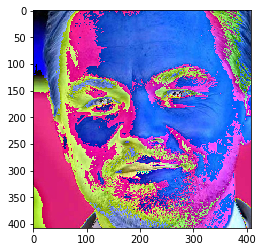

(204, 204, 3)


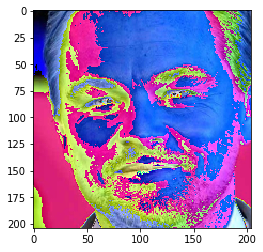

In [4]:
def reduce_resolution(ims):
    O, M, N, P = ims.shape
    K = 2
    L = 2

    MK = M // K
    NL = N // L
    return ims.reshape(-1, MK, K, NL, L, P).mean(axis=(2, 4)).reshape(O, MK, NL, P)

print(x_batch[0].shape)
plt.imshow(x_batch[0])
plt.show()
im = reduce_resolution(x_batch[0:1])
print(im[0].shape)
plt.imshow(im[0])
plt.show()

C:\Users\Daniel\Anaconda3\lib\site-packages\keras\engine\training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 [D loss: 0.695614, acc.: 49.50%] [G loss: 0.765724]


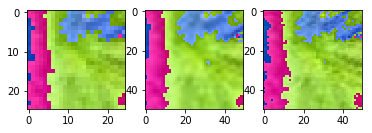

100 [D loss: 0.695724, acc.: 42.00%] [G loss: 0.737817]


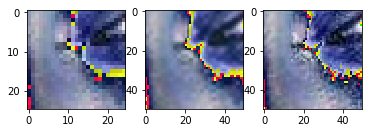

200 [D loss: 0.693164, acc.: 58.75%] [G loss: 0.754412]


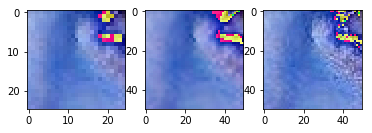

300 [D loss: 0.700178, acc.: 42.75%] [G loss: 0.738809]


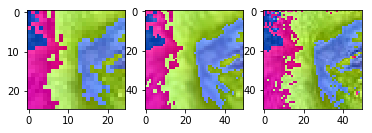

400 [D loss: 0.695245, acc.: 51.25%] [G loss: 0.759295]


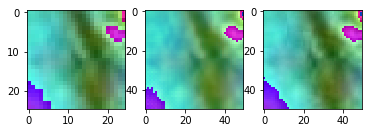

500 [D loss: 0.695537, acc.: 47.00%] [G loss: 0.736284]


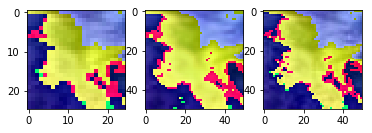

600 [D loss: 0.696064, acc.: 39.00%] [G loss: 0.716364]


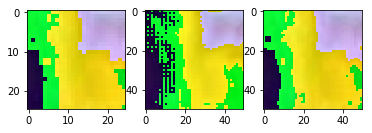

700 [D loss: 0.694959, acc.: 44.25%] [G loss: 0.748832]


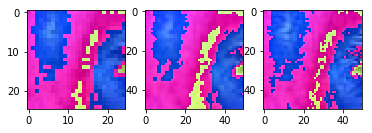

800 [D loss: 0.695139, acc.: 46.00%] [G loss: 0.761968]


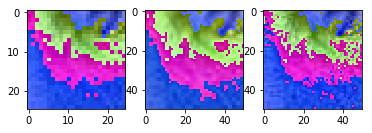

900 [D loss: 0.694293, acc.: 49.75%] [G loss: 0.796623]


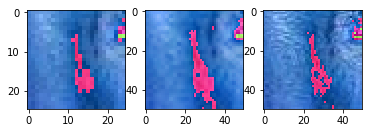

1000 [D loss: 0.699033, acc.: 39.50%] [G loss: 0.749124]


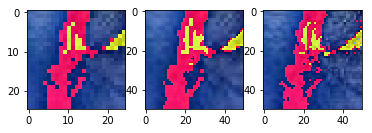

1100 [D loss: 0.695031, acc.: 47.50%] [G loss: 0.750567]


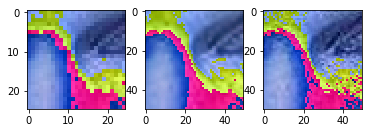

1200 [D loss: 0.695557, acc.: 47.50%] [G loss: 0.744018]


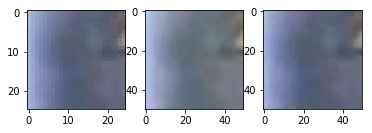

1300 [D loss: 0.695531, acc.: 41.25%] [G loss: 0.733259]


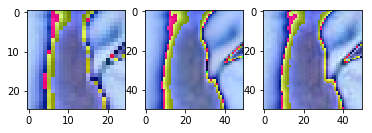

1400 [D loss: 0.695065, acc.: 45.50%] [G loss: 0.738245]


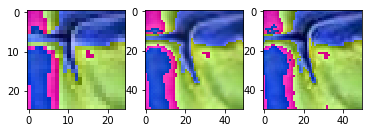

1500 [D loss: 0.694365, acc.: 50.75%] [G loss: 0.769193]


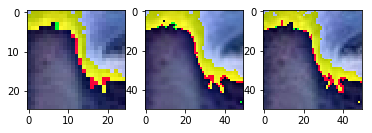

1600 [D loss: 0.695548, acc.: 44.00%] [G loss: 0.743245]


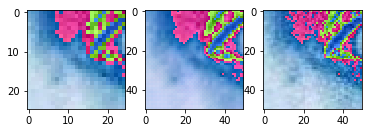

1700 [D loss: 0.694975, acc.: 42.50%] [G loss: 0.736641]


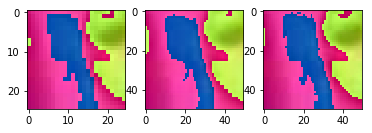

1800 [D loss: 0.694586, acc.: 47.25%] [G loss: 0.739447]


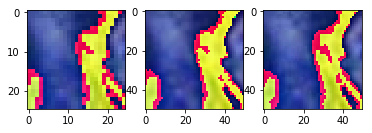

1900 [D loss: 0.696000, acc.: 43.00%] [G loss: 0.761028]


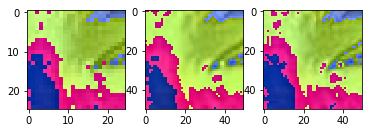

2000 [D loss: 0.696754, acc.: 40.75%] [G loss: 0.748755]


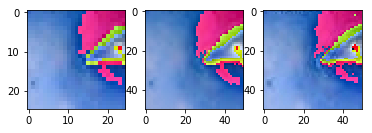

2100 [D loss: 0.696607, acc.: 48.00%] [G loss: 0.747360]


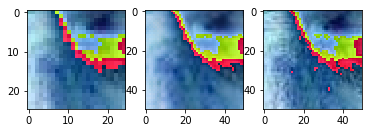

2200 [D loss: 0.695617, acc.: 49.25%] [G loss: 0.732169]


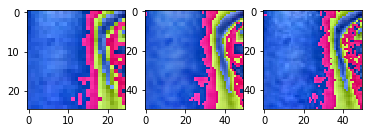

2300 [D loss: 0.696668, acc.: 41.00%] [G loss: 0.787065]


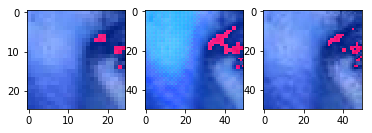

2400 [D loss: 0.695288, acc.: 44.75%] [G loss: 0.729582]


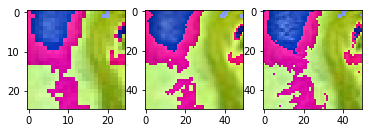

2500 [D loss: 0.690623, acc.: 47.50%] [G loss: 0.770339]


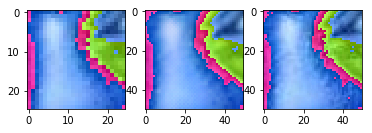

2600 [D loss: 0.700020, acc.: 46.00%] [G loss: 0.742254]


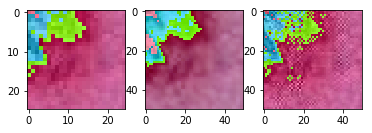

2700 [D loss: 0.696251, acc.: 45.75%] [G loss: 0.767937]


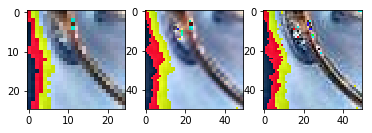

2800 [D loss: 0.696186, acc.: 45.50%] [G loss: 0.768708]


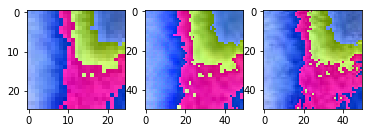

2900 [D loss: 0.695554, acc.: 43.00%] [G loss: 0.778417]


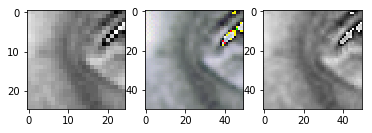

3000 [D loss: 0.695801, acc.: 45.50%] [G loss: 0.740791]


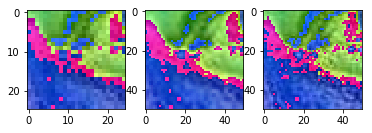

3100 [D loss: 0.695161, acc.: 39.75%] [G loss: 0.764162]


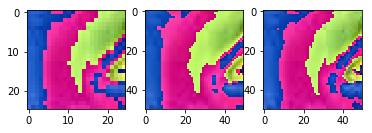

3200 [D loss: 0.695407, acc.: 46.50%] [G loss: 0.761243]


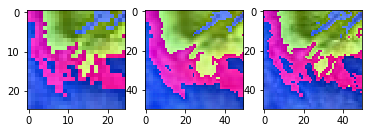

3300 [D loss: 0.697948, acc.: 48.75%] [G loss: 0.737459]


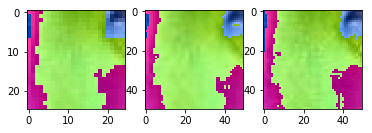

3400 [D loss: 0.695475, acc.: 52.75%] [G loss: 0.733425]


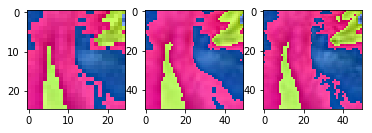

3500 [D loss: 0.698514, acc.: 48.25%] [G loss: 0.750633]


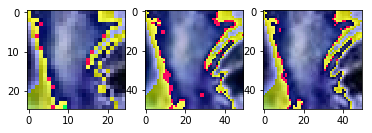

3600 [D loss: 0.698449, acc.: 43.50%] [G loss: 0.725542]


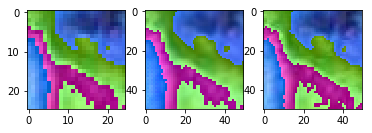

3700 [D loss: 0.693895, acc.: 50.00%] [G loss: 0.725682]


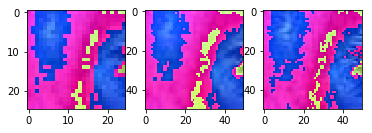

3800 [D loss: 0.698221, acc.: 48.75%] [G loss: 0.753875]


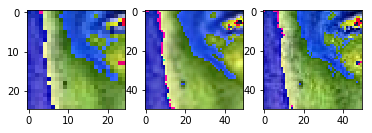

3900 [D loss: 0.695632, acc.: 50.00%] [G loss: 0.768142]


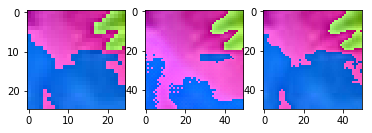

4000 [D loss: 0.696777, acc.: 49.00%] [G loss: 0.778914]


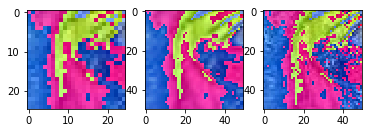

4100 [D loss: 0.697450, acc.: 50.25%] [G loss: 0.788172]


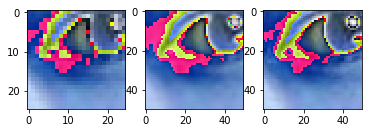

4200 [D loss: 0.699517, acc.: 44.00%] [G loss: 0.733956]


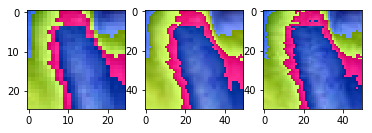

4300 [D loss: 0.697201, acc.: 42.25%] [G loss: 0.751181]


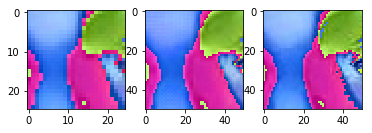

4400 [D loss: 0.695685, acc.: 45.75%] [G loss: 0.749166]


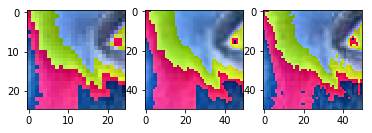

4500 [D loss: 0.695729, acc.: 47.00%] [G loss: 0.748937]


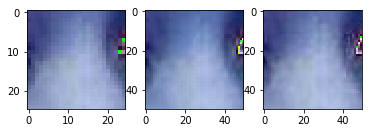

4600 [D loss: 0.695889, acc.: 45.50%] [G loss: 0.716624]


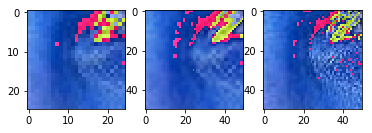

4700 [D loss: 0.694877, acc.: 49.00%] [G loss: 0.713715]


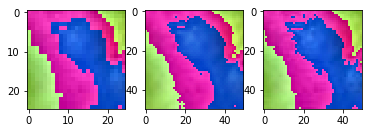

4800 [D loss: 0.696127, acc.: 41.75%] [G loss: 0.722832]


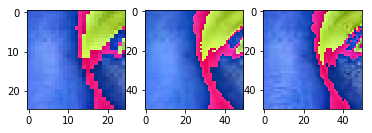

4900 [D loss: 0.695365, acc.: 44.50%] [G loss: 0.733998]


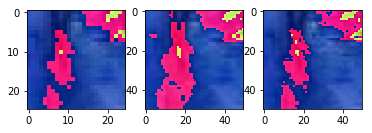

5000 [D loss: 0.693588, acc.: 51.75%] [G loss: 0.815147]


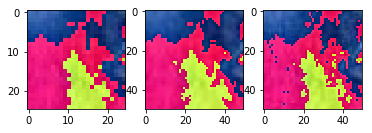

5100 [D loss: 0.698610, acc.: 42.25%] [G loss: 0.756791]


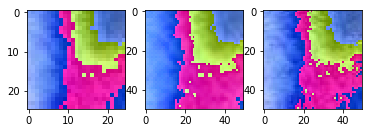

5200 [D loss: 0.696094, acc.: 43.25%] [G loss: 0.729371]


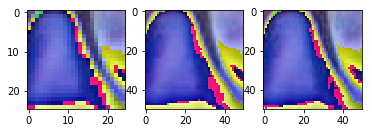

5300 [D loss: 0.695373, acc.: 45.75%] [G loss: 0.731802]


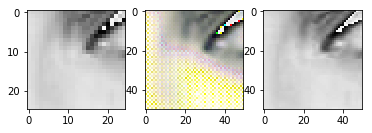

5400 [D loss: 0.695449, acc.: 45.25%] [G loss: 0.737092]


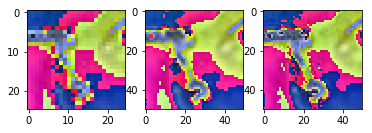

5500 [D loss: 0.694455, acc.: 51.00%] [G loss: 0.726703]


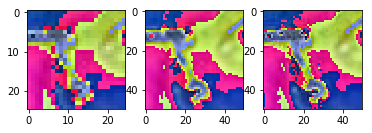

5600 [D loss: 0.697797, acc.: 45.50%] [G loss: 0.744039]


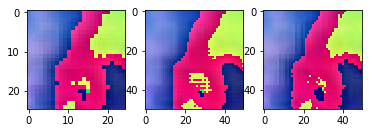

5700 [D loss: 0.695844, acc.: 48.00%] [G loss: 0.780231]


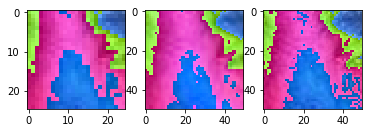

5800 [D loss: 0.696994, acc.: 43.75%] [G loss: 0.774707]


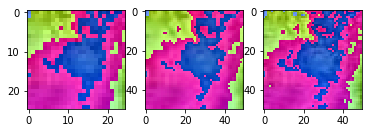

5900 [D loss: 0.695541, acc.: 47.25%] [G loss: 0.760121]


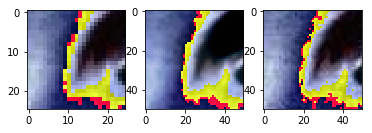

6000 [D loss: 0.695862, acc.: 40.00%] [G loss: 0.754381]


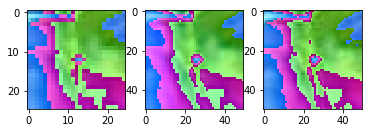

6100 [D loss: 0.694792, acc.: 41.25%] [G loss: 0.705957]


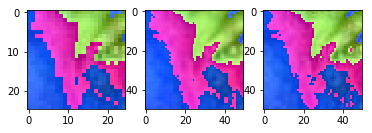

6200 [D loss: 0.695587, acc.: 50.25%] [G loss: 0.760284]


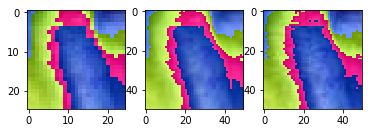

6300 [D loss: 0.695768, acc.: 48.25%] [G loss: 0.727796]


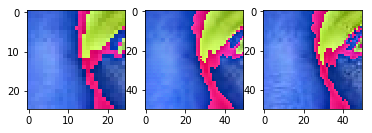

6400 [D loss: 0.696457, acc.: 41.75%] [G loss: 0.736651]


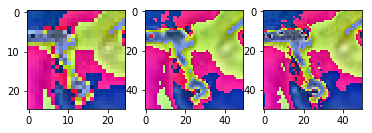

6500 [D loss: 0.695282, acc.: 42.25%] [G loss: 0.727703]


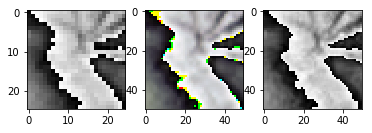

6600 [D loss: 0.695159, acc.: 38.25%] [G loss: 0.738963]


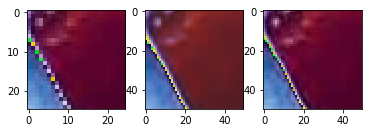

6700 [D loss: 0.695101, acc.: 45.75%] [G loss: 0.724980]


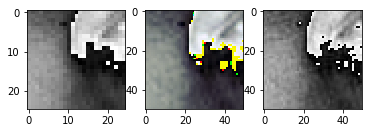

6800 [D loss: 0.694772, acc.: 37.50%] [G loss: 0.741780]


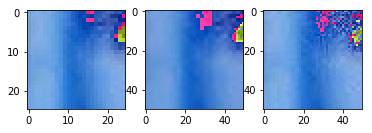

6900 [D loss: 0.694332, acc.: 45.75%] [G loss: 0.732582]


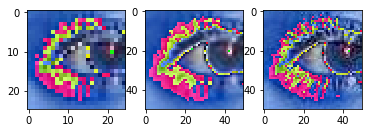

7000 [D loss: 0.696290, acc.: 49.50%] [G loss: 0.749644]


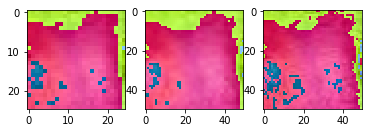

7100 [D loss: 0.694580, acc.: 39.75%] [G loss: 0.774583]


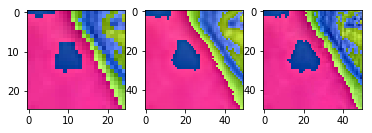

7200 [D loss: 0.694939, acc.: 44.75%] [G loss: 0.743828]


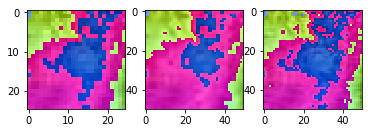

7300 [D loss: 0.694444, acc.: 40.00%] [G loss: 0.789805]


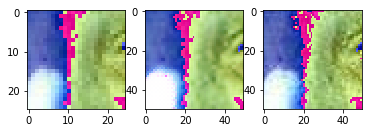

7400 [D loss: 0.694070, acc.: 40.25%] [G loss: 0.732257]


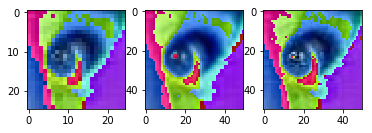

7500 [D loss: 0.695224, acc.: 45.25%] [G loss: 0.751641]


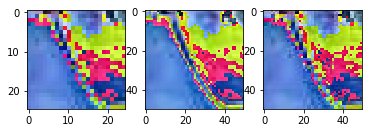

7600 [D loss: 0.693968, acc.: 41.00%] [G loss: 0.726798]


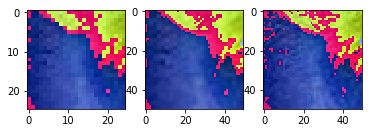

7700 [D loss: 0.694603, acc.: 35.50%] [G loss: 0.730093]


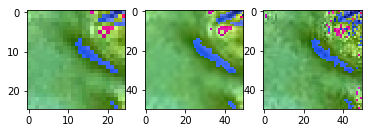

7800 [D loss: 0.694758, acc.: 43.00%] [G loss: 0.753533]


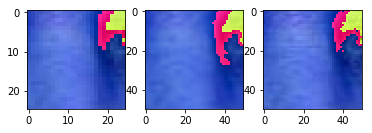

7900 [D loss: 0.694179, acc.: 44.00%] [G loss: 0.757354]


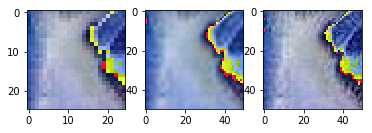

8000 [D loss: 0.695070, acc.: 48.00%] [G loss: 0.754100]


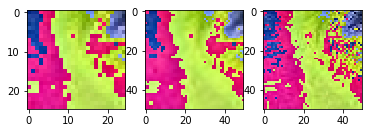

8100 [D loss: 0.693467, acc.: 51.25%] [G loss: 0.717667]


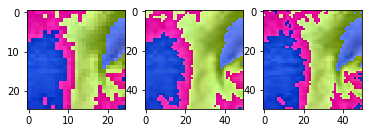

8200 [D loss: 0.699160, acc.: 41.25%] [G loss: 0.734941]


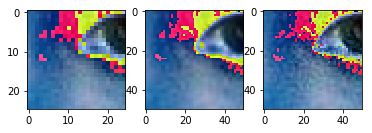

8300 [D loss: 0.695849, acc.: 43.25%] [G loss: 0.729760]


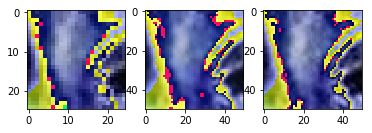

8400 [D loss: 0.695688, acc.: 44.50%] [G loss: 0.731965]


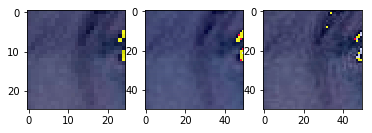

8500 [D loss: 0.695607, acc.: 40.75%] [G loss: 0.741042]


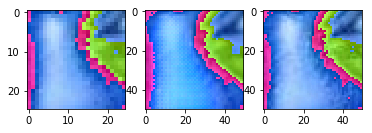

8600 [D loss: 0.695024, acc.: 42.50%] [G loss: 0.735945]


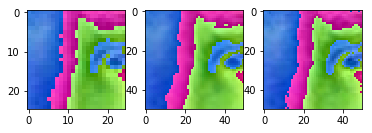

8700 [D loss: 0.695105, acc.: 43.75%] [G loss: 0.708812]


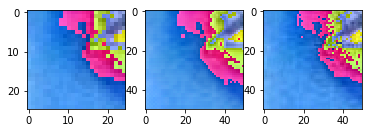

8800 [D loss: 0.694466, acc.: 42.75%] [G loss: 0.766114]


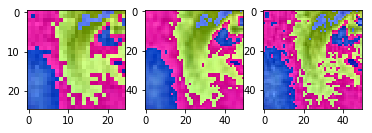

8900 [D loss: 0.693289, acc.: 50.00%] [G loss: 0.736750]


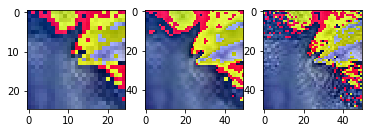

9000 [D loss: 0.694874, acc.: 41.25%] [G loss: 0.724295]


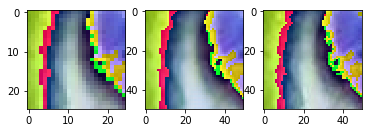

9100 [D loss: 0.692776, acc.: 47.00%] [G loss: 0.673683]


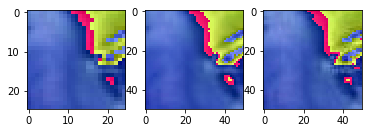

9200 [D loss: 0.697457, acc.: 40.75%] [G loss: 0.726943]


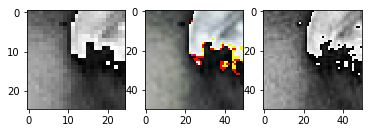

9300 [D loss: 0.697583, acc.: 41.00%] [G loss: 0.776365]


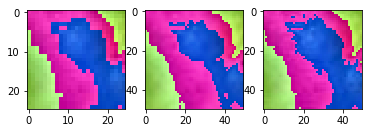

9400 [D loss: 0.695186, acc.: 47.00%] [G loss: 0.764782]


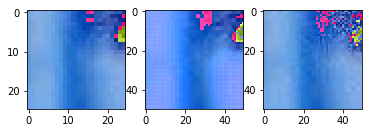

9500 [D loss: 0.696560, acc.: 42.25%] [G loss: 0.726868]


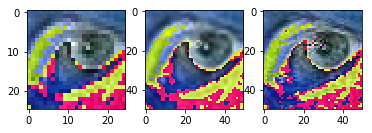

9600 [D loss: 0.694891, acc.: 36.75%] [G loss: 0.752488]


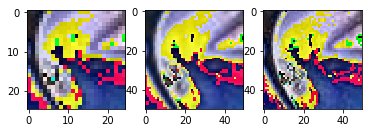

9700 [D loss: 0.695226, acc.: 40.50%] [G loss: 0.757678]


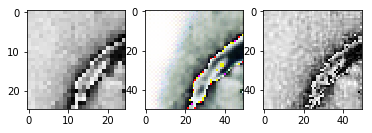

9800 [D loss: 0.696240, acc.: 46.25%] [G loss: 0.741093]


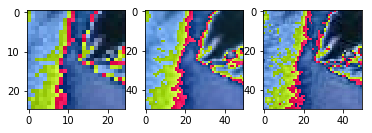

9900 [D loss: 0.697243, acc.: 41.25%] [G loss: 0.725573]


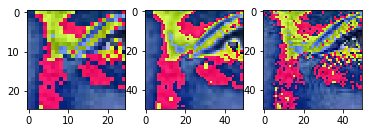

10000 [D loss: 0.695681, acc.: 46.50%] [G loss: 0.736596]


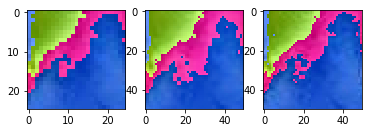

10100 [D loss: 0.697401, acc.: 45.00%] [G loss: 0.734291]


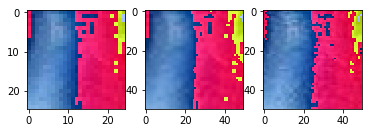

10200 [D loss: 0.695978, acc.: 41.50%] [G loss: 0.745526]


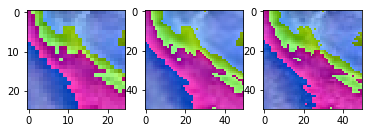

10300 [D loss: 0.695301, acc.: 42.00%] [G loss: 0.729670]


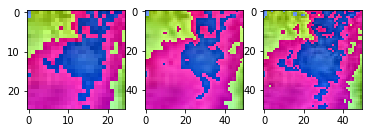

10400 [D loss: 0.694939, acc.: 41.00%] [G loss: 0.733393]


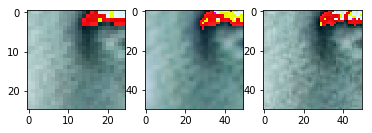

10500 [D loss: 0.695601, acc.: 39.75%] [G loss: 0.725882]


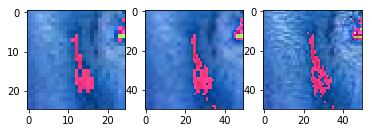

10600 [D loss: 0.695013, acc.: 46.75%] [G loss: 0.721958]


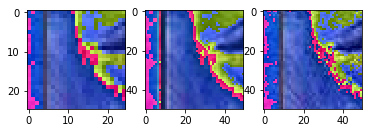

10700 [D loss: 0.697524, acc.: 49.75%] [G loss: 0.752209]


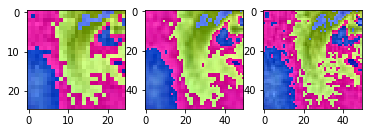

10800 [D loss: 0.696325, acc.: 48.50%] [G loss: 0.731313]


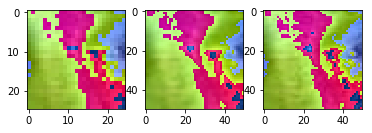

10900 [D loss: 0.696096, acc.: 43.75%] [G loss: 0.734997]


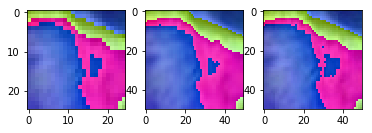

11000 [D loss: 0.696441, acc.: 46.50%] [G loss: 0.749293]


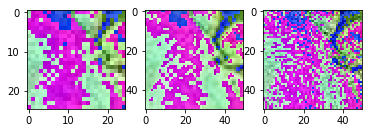

11100 [D loss: 0.695277, acc.: 44.75%] [G loss: 0.749613]


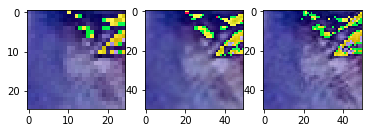

11200 [D loss: 0.695779, acc.: 46.00%] [G loss: 0.762721]


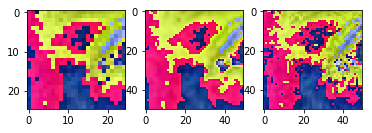

11300 [D loss: 0.695264, acc.: 46.00%] [G loss: 0.762011]


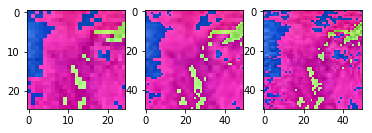

11400 [D loss: 0.695256, acc.: 49.00%] [G loss: 0.735218]


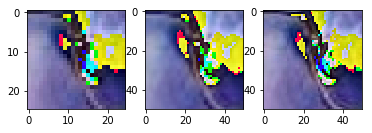

11500 [D loss: 0.694950, acc.: 45.50%] [G loss: 0.729491]


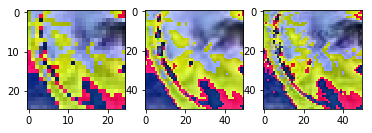

11600 [D loss: 0.695378, acc.: 45.75%] [G loss: 0.741049]


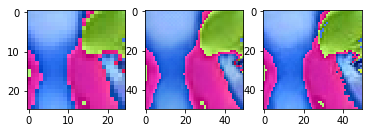

11700 [D loss: 0.695308, acc.: 46.75%] [G loss: 0.764115]


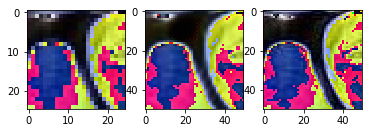

11800 [D loss: 0.695443, acc.: 46.25%] [G loss: 0.722461]


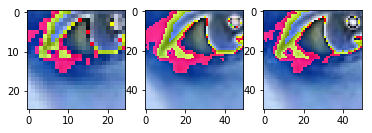

11900 [D loss: 0.694923, acc.: 39.50%] [G loss: 0.746285]


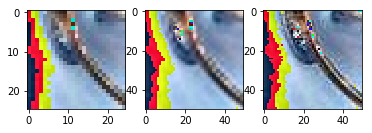

12000 [D loss: 0.694115, acc.: 42.25%] [G loss: 0.729334]


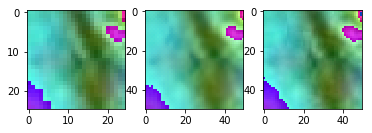

12100 [D loss: 0.695821, acc.: 47.50%] [G loss: 0.739122]


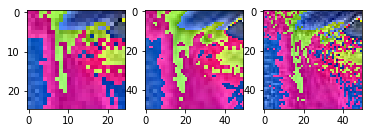

12200 [D loss: 0.695088, acc.: 40.50%] [G loss: 0.733900]


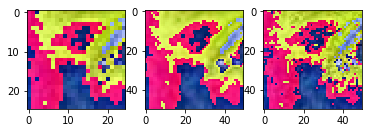

12300 [D loss: 0.694593, acc.: 41.25%] [G loss: 0.729066]


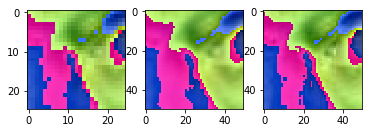

12400 [D loss: 0.694878, acc.: 41.50%] [G loss: 0.724650]


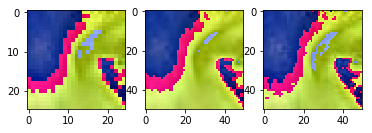

12500 [D loss: 0.694512, acc.: 42.00%] [G loss: 0.752871]


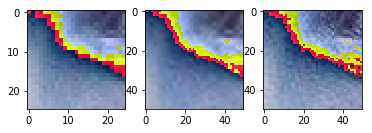

12600 [D loss: 0.695791, acc.: 40.50%] [G loss: 0.726098]


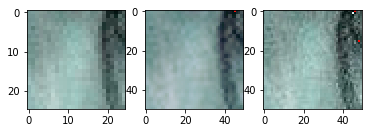

12700 [D loss: 0.694387, acc.: 46.25%] [G loss: 0.760002]


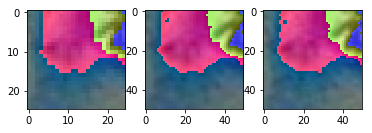

12800 [D loss: 0.694864, acc.: 44.00%] [G loss: 0.735448]


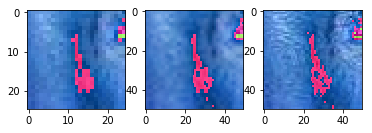

12900 [D loss: 0.694201, acc.: 49.50%] [G loss: 0.759647]


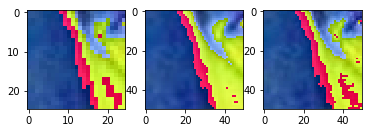

13000 [D loss: 0.694332, acc.: 44.75%] [G loss: 0.749767]


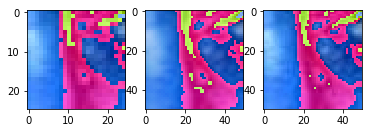

13100 [D loss: 0.696601, acc.: 37.00%] [G loss: 0.735261]


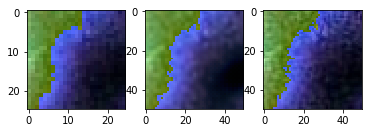

13200 [D loss: 0.695474, acc.: 48.25%] [G loss: 0.742450]


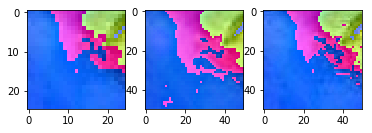

13300 [D loss: 0.696385, acc.: 43.50%] [G loss: 0.732414]


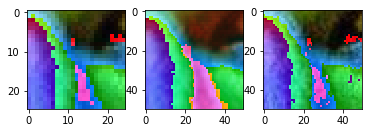

13400 [D loss: 0.694690, acc.: 45.00%] [G loss: 0.741673]


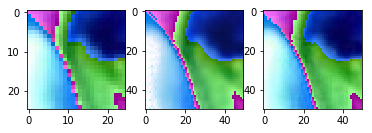

13500 [D loss: 0.695198, acc.: 44.75%] [G loss: 0.758997]


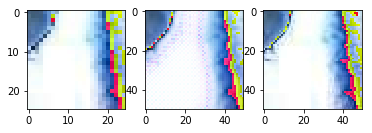

13600 [D loss: 0.694834, acc.: 38.75%] [G loss: 0.748974]


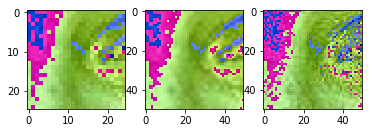

13700 [D loss: 0.695354, acc.: 44.50%] [G loss: 0.727816]


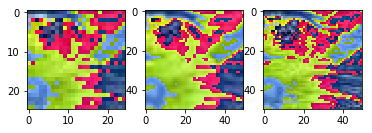

13800 [D loss: 0.695165, acc.: 40.50%] [G loss: 0.739027]


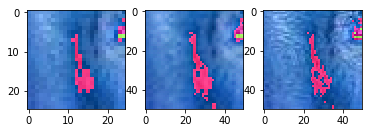

13900 [D loss: 0.694277, acc.: 42.00%] [G loss: 0.749895]


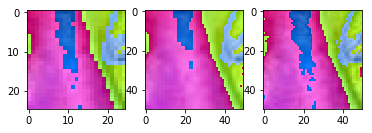

14000 [D loss: 0.695371, acc.: 43.75%] [G loss: 0.748138]


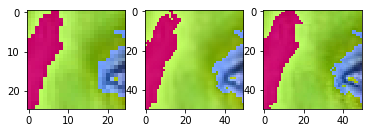

14100 [D loss: 0.695988, acc.: 45.00%] [G loss: 0.742520]


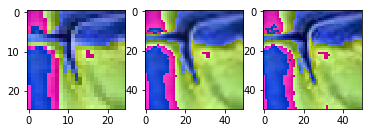

14200 [D loss: 0.695972, acc.: 43.25%] [G loss: 0.750910]


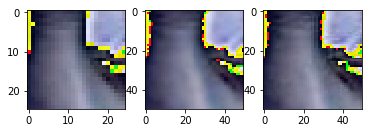

14300 [D loss: 0.694568, acc.: 44.50%] [G loss: 0.741770]


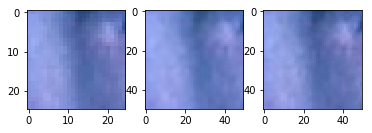

14400 [D loss: 0.694956, acc.: 47.50%] [G loss: 0.734259]


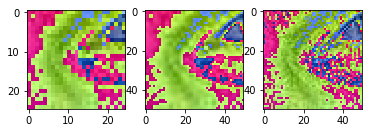

14500 [D loss: 0.694353, acc.: 47.75%] [G loss: 0.698636]


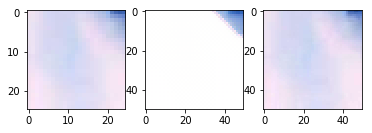

14600 [D loss: 0.695624, acc.: 49.75%] [G loss: 0.742416]


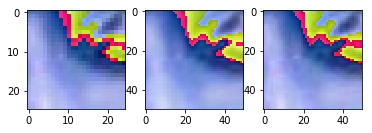

14700 [D loss: 0.700709, acc.: 47.25%] [G loss: 0.739784]


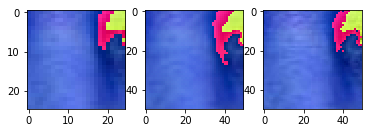

14800 [D loss: 0.696990, acc.: 42.75%] [G loss: 0.744763]


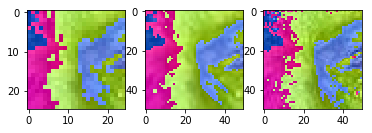

14900 [D loss: 0.694626, acc.: 36.50%] [G loss: 0.740576]


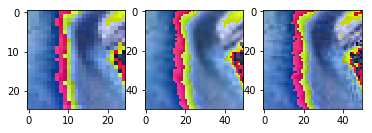

15000 [D loss: 0.694646, acc.: 48.75%] [G loss: 0.721860]


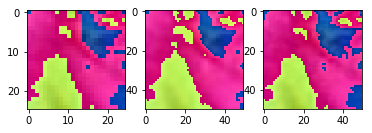

15100 [D loss: 0.694810, acc.: 49.75%] [G loss: 0.715782]


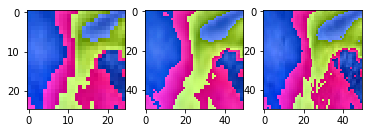

15200 [D loss: 0.695978, acc.: 55.00%] [G loss: 0.710882]


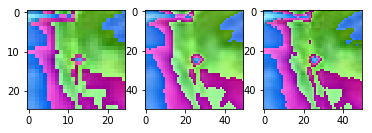

15300 [D loss: 0.696757, acc.: 44.25%] [G loss: 0.754951]


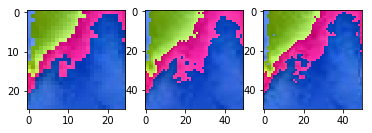

15400 [D loss: 0.696463, acc.: 38.00%] [G loss: 0.742129]


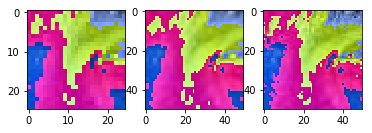

15500 [D loss: 0.695055, acc.: 47.50%] [G loss: 0.734615]


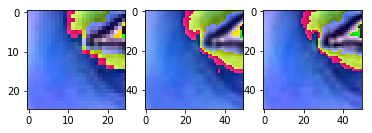

15600 [D loss: 0.694780, acc.: 48.25%] [G loss: 0.885668]


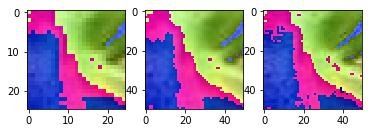

15700 [D loss: 0.694258, acc.: 51.00%] [G loss: 0.729127]


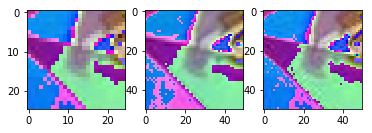

15800 [D loss: 0.697221, acc.: 42.75%] [G loss: 0.749030]


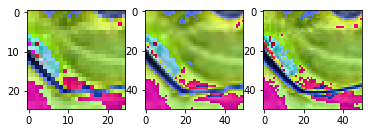

15900 [D loss: 0.694903, acc.: 47.25%] [G loss: 0.730186]


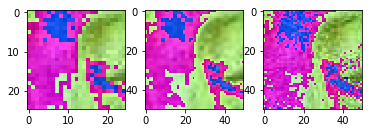

16000 [D loss: 0.695117, acc.: 45.25%] [G loss: 0.730868]


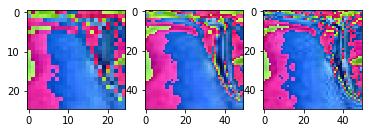

16100 [D loss: 0.694851, acc.: 43.00%] [G loss: 0.776477]


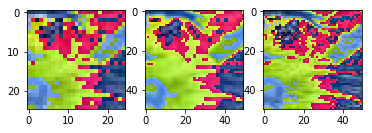

16200 [D loss: 0.694677, acc.: 43.00%] [G loss: 0.717844]


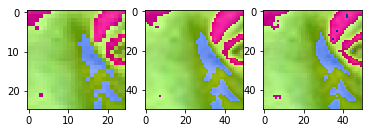

16300 [D loss: 0.694319, acc.: 45.50%] [G loss: 0.722974]


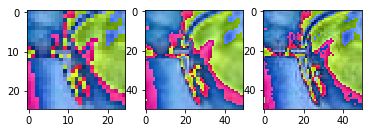

16400 [D loss: 0.695147, acc.: 39.25%] [G loss: 0.742842]


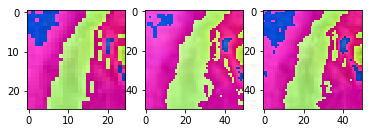

16500 [D loss: 0.694567, acc.: 48.25%] [G loss: 0.746124]


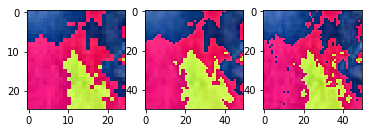

16600 [D loss: 0.694327, acc.: 37.25%] [G loss: 0.743708]


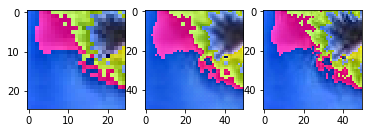

16700 [D loss: 0.694195, acc.: 40.00%] [G loss: 0.724354]


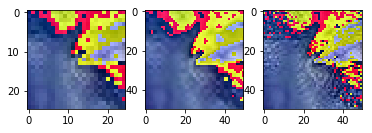

16800 [D loss: 0.694481, acc.: 42.50%] [G loss: 0.753673]


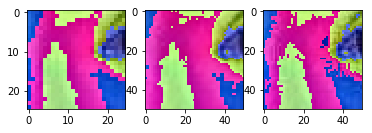

16900 [D loss: 0.694638, acc.: 45.75%] [G loss: 0.738429]


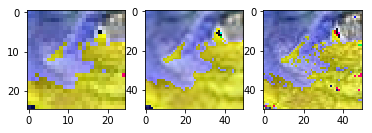

17000 [D loss: 0.694996, acc.: 42.75%] [G loss: 0.727928]


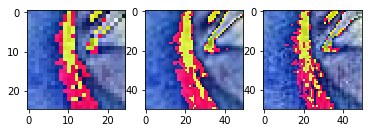

17100 [D loss: 0.695613, acc.: 39.25%] [G loss: 0.739522]


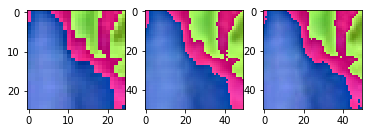

17200 [D loss: 0.695710, acc.: 46.00%] [G loss: 0.762548]


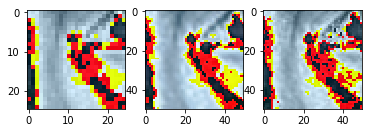

17300 [D loss: 0.695999, acc.: 41.75%] [G loss: 0.729516]


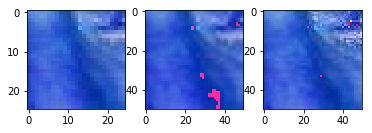

17400 [D loss: 0.693632, acc.: 53.25%] [G loss: 0.751880]


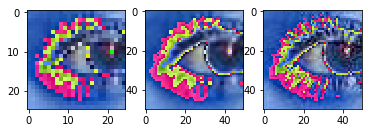

17500 [D loss: 0.697107, acc.: 42.00%] [G loss: 0.722363]


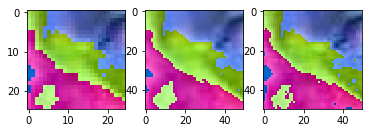

17600 [D loss: 0.695510, acc.: 41.75%] [G loss: 0.771102]


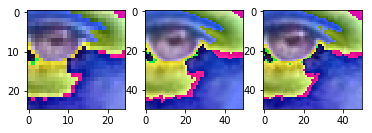

17700 [D loss: 0.695761, acc.: 40.50%] [G loss: 0.746108]


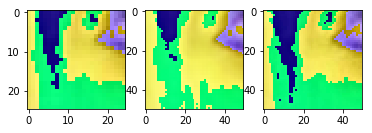

17800 [D loss: 0.694442, acc.: 42.75%] [G loss: 0.751693]


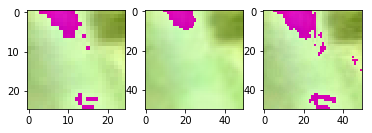

17900 [D loss: 0.694909, acc.: 46.75%] [G loss: 0.741385]


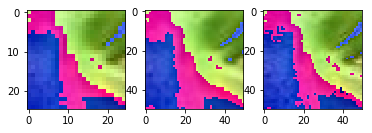

18000 [D loss: 0.694621, acc.: 47.00%] [G loss: 0.747129]


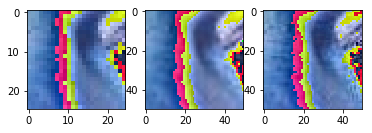

18100 [D loss: 0.690085, acc.: 45.50%] [G loss: 0.727493]


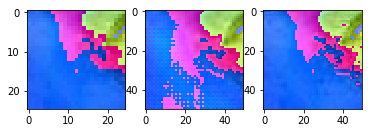

18200 [D loss: 0.699613, acc.: 48.75%] [G loss: 0.761036]


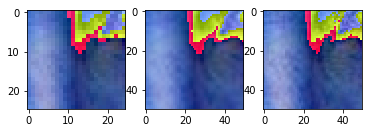

18300 [D loss: 0.680849, acc.: 52.25%] [G loss: 0.806612]


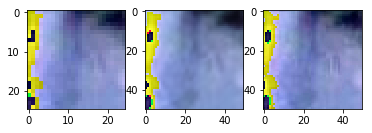

18400 [D loss: 0.706898, acc.: 48.25%] [G loss: 0.753007]


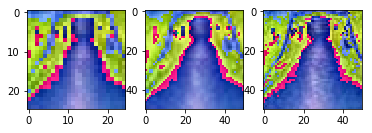

18500 [D loss: 0.694269, acc.: 42.00%] [G loss: 0.731197]


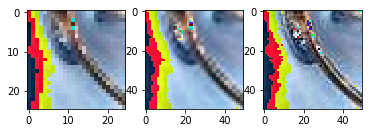

18600 [D loss: 0.697191, acc.: 39.00%] [G loss: 0.727975]


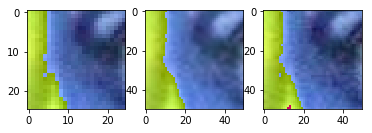

18700 [D loss: 0.695095, acc.: 45.25%] [G loss: 0.746808]


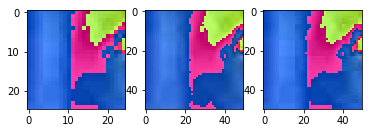

18800 [D loss: 0.695045, acc.: 46.50%] [G loss: 0.720889]


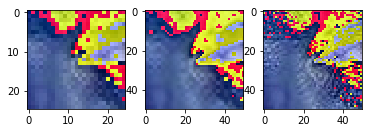

18900 [D loss: 0.695376, acc.: 47.75%] [G loss: 0.769102]


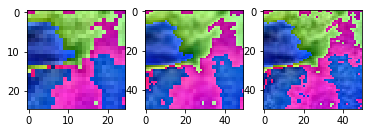

19000 [D loss: 0.696135, acc.: 47.25%] [G loss: 0.738629]


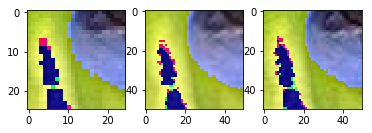

19100 [D loss: 0.695387, acc.: 41.00%] [G loss: 0.722078]


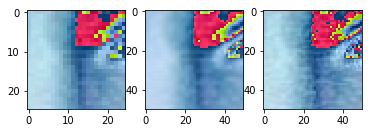

19200 [D loss: 0.694568, acc.: 48.25%] [G loss: 0.755402]


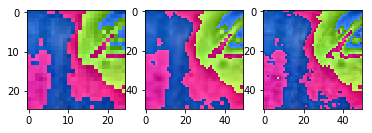

19300 [D loss: 0.695980, acc.: 43.00%] [G loss: 0.746161]


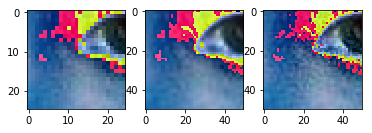

19400 [D loss: 0.695051, acc.: 46.50%] [G loss: 0.742069]


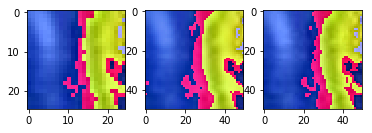

19500 [D loss: 0.694757, acc.: 39.75%] [G loss: 0.745367]


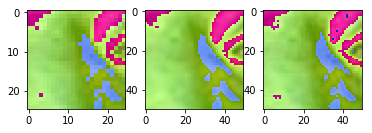

19600 [D loss: 0.694180, acc.: 47.25%] [G loss: 0.741351]


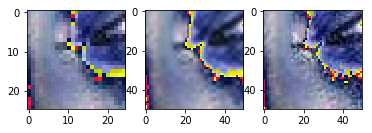

19700 [D loss: 0.695263, acc.: 45.25%] [G loss: 0.723760]


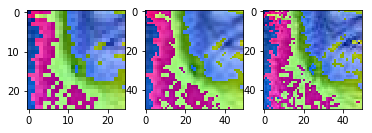

19800 [D loss: 0.694723, acc.: 43.50%] [G loss: 0.730564]


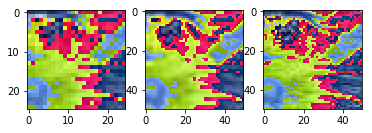

19900 [D loss: 0.696119, acc.: 43.25%] [G loss: 0.713109]


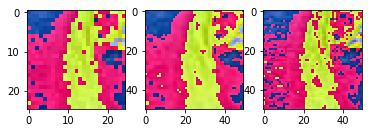

20000 [D loss: 0.694766, acc.: 41.00%] [G loss: 0.729826]


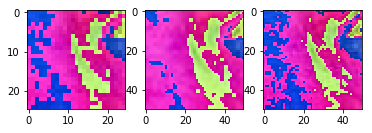

20100 [D loss: 0.694891, acc.: 44.50%] [G loss: 0.733268]


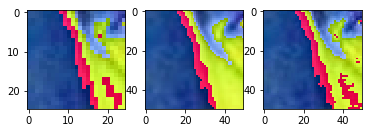

20200 [D loss: 0.695255, acc.: 37.50%] [G loss: 0.742926]


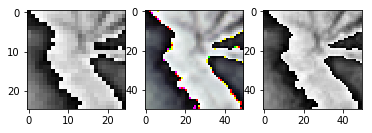

20300 [D loss: 0.695076, acc.: 46.75%] [G loss: 0.729979]


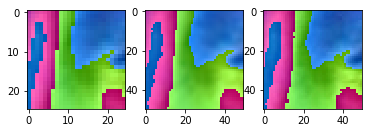

20400 [D loss: 0.695192, acc.: 43.75%] [G loss: 0.746358]


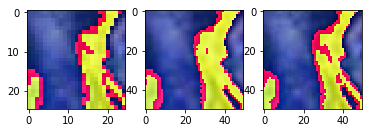

20500 [D loss: 0.695679, acc.: 41.75%] [G loss: 0.759348]


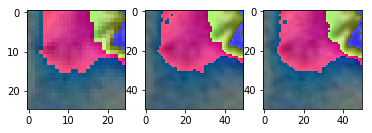

20600 [D loss: 0.694193, acc.: 43.00%] [G loss: 0.753678]


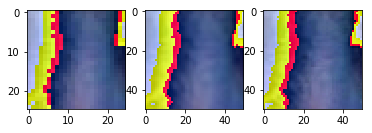

20700 [D loss: 0.694409, acc.: 44.75%] [G loss: 0.745951]


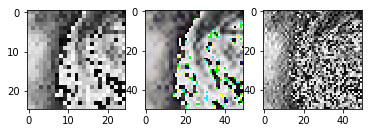

20800 [D loss: 0.696210, acc.: 44.25%] [G loss: 0.739604]


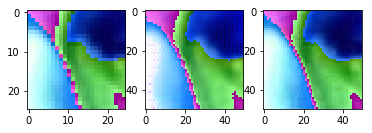

20900 [D loss: 0.693800, acc.: 49.00%] [G loss: 0.721430]


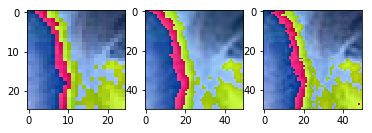

21000 [D loss: 0.695870, acc.: 46.75%] [G loss: 0.740472]


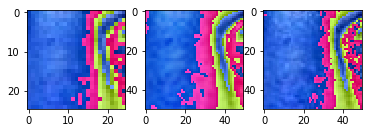

21100 [D loss: 0.697063, acc.: 43.50%] [G loss: 0.744629]


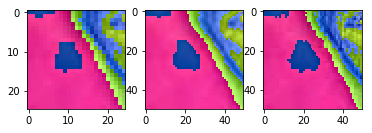

21200 [D loss: 0.695692, acc.: 46.75%] [G loss: 0.760127]


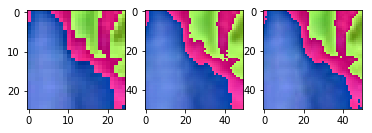

21300 [D loss: 0.695322, acc.: 41.50%] [G loss: 0.731746]


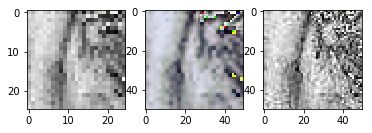

21400 [D loss: 0.694636, acc.: 41.00%] [G loss: 0.751764]


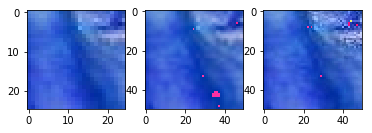

21500 [D loss: 0.695483, acc.: 45.25%] [G loss: 0.729616]


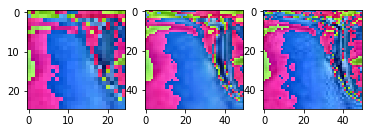

21600 [D loss: 0.695077, acc.: 50.25%] [G loss: 0.750669]


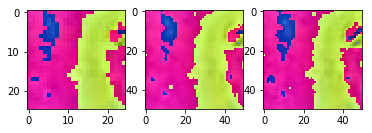

21700 [D loss: 0.695718, acc.: 48.25%] [G loss: 0.728288]


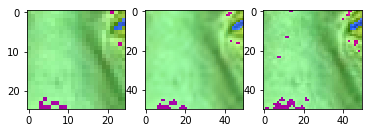

21800 [D loss: 0.694976, acc.: 49.75%] [G loss: 0.725396]


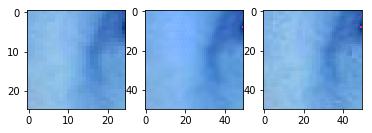

21900 [D loss: 0.695457, acc.: 46.00%] [G loss: 0.729462]


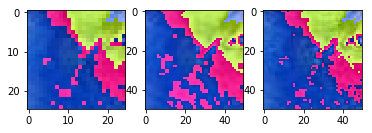

22000 [D loss: 0.695643, acc.: 44.50%] [G loss: 0.728831]


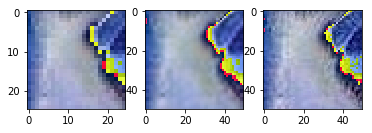

22100 [D loss: 0.695551, acc.: 40.25%] [G loss: 0.758247]


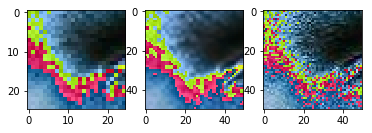

22200 [D loss: 0.694975, acc.: 43.00%] [G loss: 0.723750]


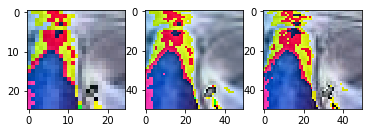

22300 [D loss: 0.695974, acc.: 46.50%] [G loss: 0.735901]


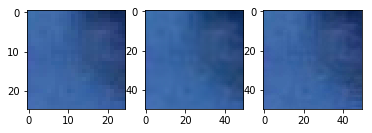

22400 [D loss: 0.695342, acc.: 42.25%] [G loss: 0.759733]


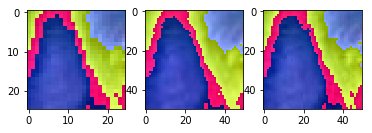

22500 [D loss: 0.695224, acc.: 43.00%] [G loss: 0.736206]


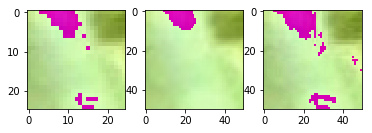

22600 [D loss: 0.694698, acc.: 41.50%] [G loss: 0.717783]


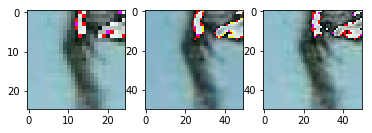

22700 [D loss: 0.694531, acc.: 43.00%] [G loss: 0.740657]


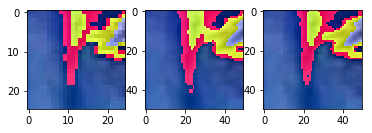

22800 [D loss: 0.694862, acc.: 43.00%] [G loss: 0.735579]


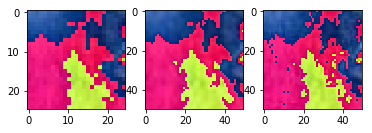

22900 [D loss: 0.694951, acc.: 45.00%] [G loss: 0.739976]


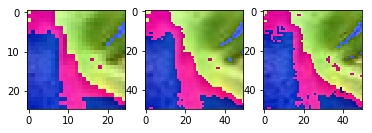

23000 [D loss: 0.694179, acc.: 44.50%] [G loss: 0.733080]


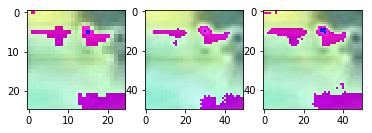

23100 [D loss: 0.694783, acc.: 43.75%] [G loss: 0.740989]


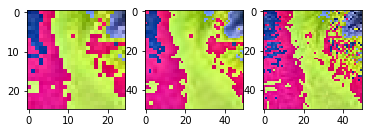

23200 [D loss: 0.695100, acc.: 42.25%] [G loss: 0.749922]


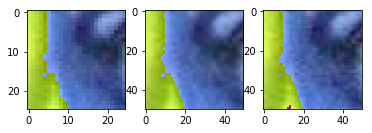

23300 [D loss: 0.694812, acc.: 42.25%] [G loss: 0.720962]


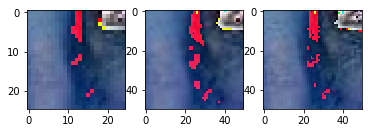

23400 [D loss: 0.694858, acc.: 48.75%] [G loss: 0.746854]


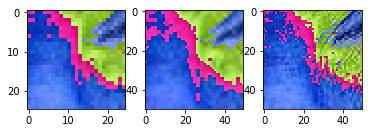

23500 [D loss: 0.694586, acc.: 50.25%] [G loss: 0.711099]


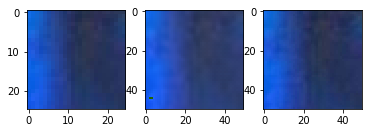

23600 [D loss: 0.695205, acc.: 43.50%] [G loss: 0.713238]


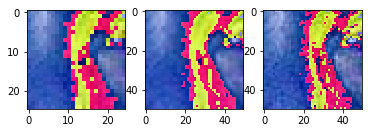

23700 [D loss: 0.695538, acc.: 43.00%] [G loss: 0.726654]


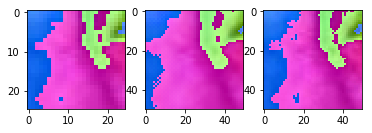

23800 [D loss: 0.695467, acc.: 40.75%] [G loss: 0.749721]


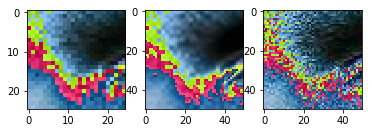

23900 [D loss: 0.694048, acc.: 42.50%] [G loss: 0.742649]


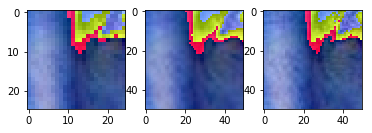

24000 [D loss: 0.694599, acc.: 44.00%] [G loss: 0.751271]


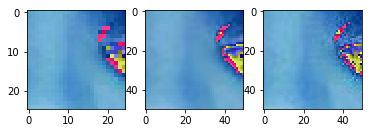

24100 [D loss: 0.694533, acc.: 43.25%] [G loss: 0.732399]


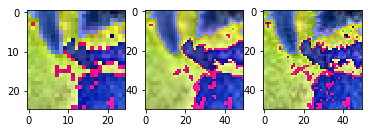

24200 [D loss: 0.694220, acc.: 41.50%] [G loss: 0.726624]


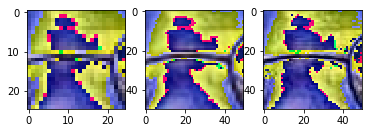

24300 [D loss: 0.693869, acc.: 48.00%] [G loss: 0.736870]


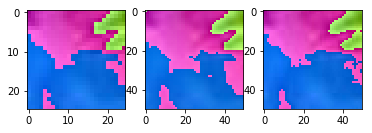

24400 [D loss: 0.696817, acc.: 48.00%] [G loss: 0.748766]


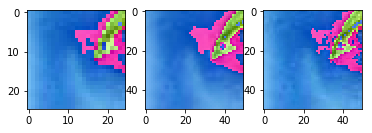

24500 [D loss: 0.695257, acc.: 45.50%] [G loss: 0.746357]


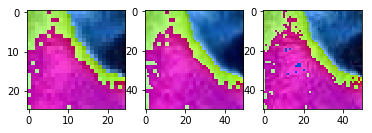

24600 [D loss: 0.690010, acc.: 47.25%] [G loss: 0.746457]


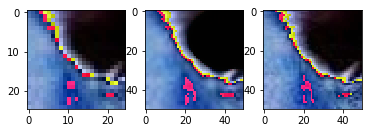

24700 [D loss: 0.700923, acc.: 44.25%] [G loss: 0.724720]


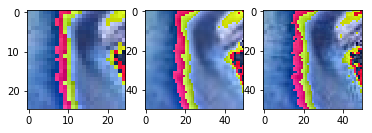

24800 [D loss: 0.694988, acc.: 48.25%] [G loss: 0.740849]


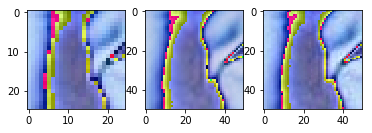

24900 [D loss: 0.694391, acc.: 36.50%] [G loss: 0.728776]


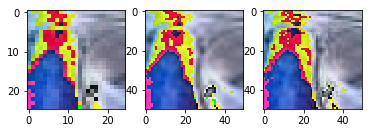

25000 [D loss: 0.694008, acc.: 41.00%] [G loss: 0.744458]


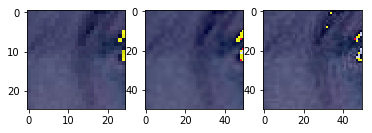

25100 [D loss: 0.695385, acc.: 43.25%] [G loss: 0.739122]


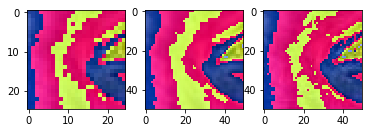

25200 [D loss: 0.695412, acc.: 47.25%] [G loss: 0.736704]


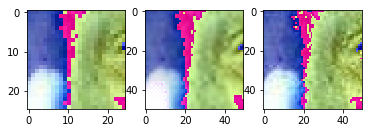

25300 [D loss: 0.695254, acc.: 45.00%] [G loss: 0.770530]


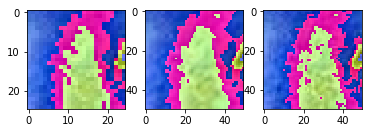

25400 [D loss: 0.695633, acc.: 48.50%] [G loss: 0.749003]


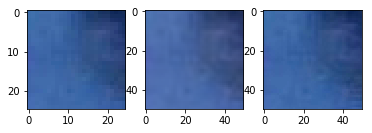

25500 [D loss: 0.695997, acc.: 48.00%] [G loss: 0.751950]


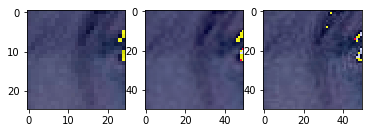

25600 [D loss: 0.695809, acc.: 46.75%] [G loss: 0.732832]


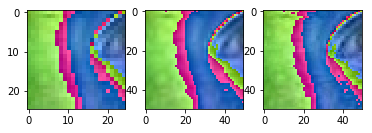

25700 [D loss: 0.694455, acc.: 44.75%] [G loss: 0.719950]


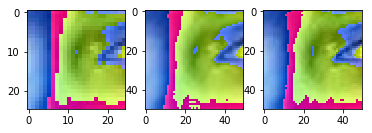

25800 [D loss: 0.695669, acc.: 44.25%] [G loss: 0.736204]


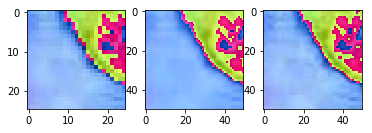

25900 [D loss: 0.694431, acc.: 49.75%] [G loss: 0.749734]


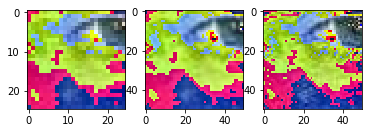

26000 [D loss: 0.697595, acc.: 48.00%] [G loss: 0.714407]


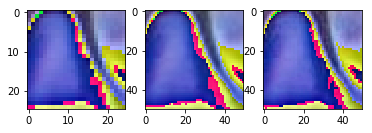

26100 [D loss: 0.696287, acc.: 48.75%] [G loss: 0.755839]


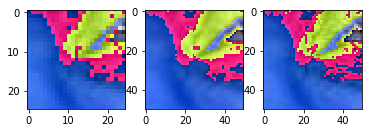

26200 [D loss: 0.696095, acc.: 47.75%] [G loss: 0.728386]


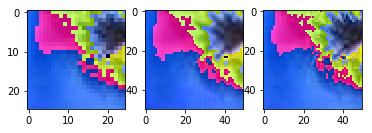

26300 [D loss: 0.695118, acc.: 43.00%] [G loss: 0.738833]


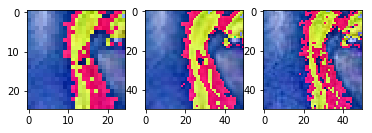

26400 [D loss: 0.694260, acc.: 50.25%] [G loss: 0.740322]


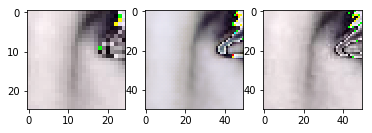

26500 [D loss: 0.695969, acc.: 42.25%] [G loss: 0.719678]


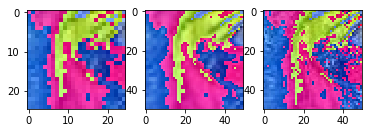

26600 [D loss: 0.695019, acc.: 41.25%] [G loss: 0.750745]


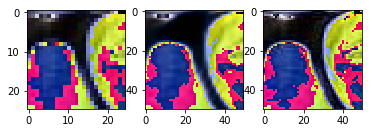

26700 [D loss: 0.694837, acc.: 49.75%] [G loss: 0.736656]


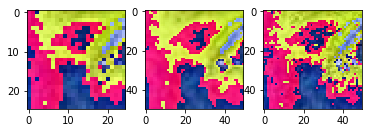

26800 [D loss: 0.694450, acc.: 46.75%] [G loss: 0.720793]


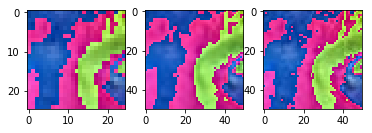

26900 [D loss: 0.694721, acc.: 45.75%] [G loss: 0.744192]


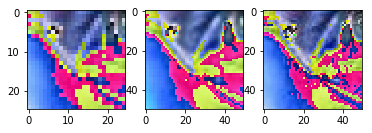

27000 [D loss: 0.693367, acc.: 46.75%] [G loss: 0.780359]


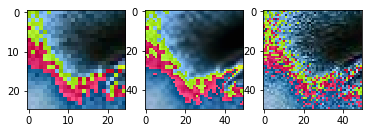

27100 [D loss: 0.697067, acc.: 41.25%] [G loss: 0.720863]


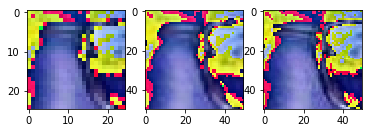

27200 [D loss: 0.695104, acc.: 37.75%] [G loss: 0.728651]


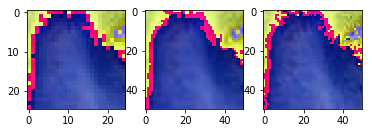

27300 [D loss: 0.695061, acc.: 46.50%] [G loss: 0.729595]


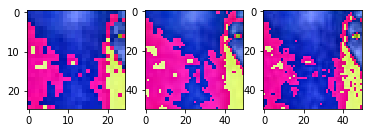

27400 [D loss: 0.694688, acc.: 38.75%] [G loss: 0.740067]


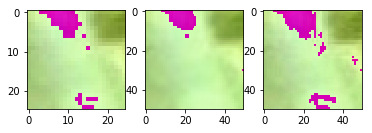

27500 [D loss: 0.695101, acc.: 41.25%] [G loss: 0.723658]


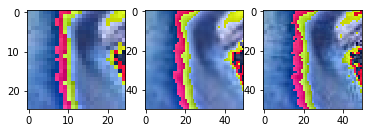

27600 [D loss: 0.694606, acc.: 41.75%] [G loss: 0.732989]


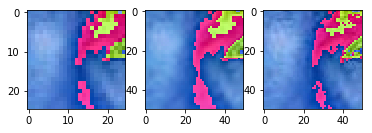

27700 [D loss: 0.695245, acc.: 50.00%] [G loss: 0.772458]


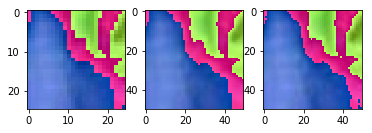

27800 [D loss: 0.695741, acc.: 51.00%] [G loss: 0.751398]


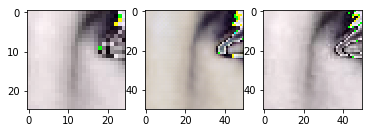

27900 [D loss: 0.695462, acc.: 41.75%] [G loss: 0.743875]


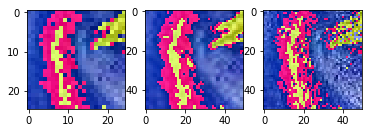

28000 [D loss: 0.693220, acc.: 49.50%] [G loss: 0.716140]


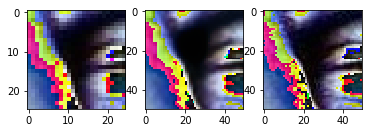

28100 [D loss: 0.696716, acc.: 43.50%] [G loss: 0.749546]


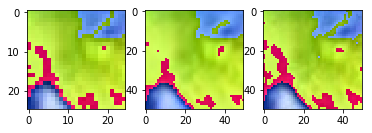

28200 [D loss: 0.695043, acc.: 44.50%] [G loss: 0.725131]


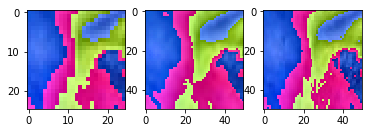

28300 [D loss: 0.694282, acc.: 44.00%] [G loss: 0.722655]


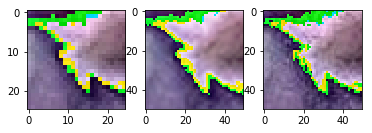

28400 [D loss: 0.694055, acc.: 44.00%] [G loss: 0.740199]


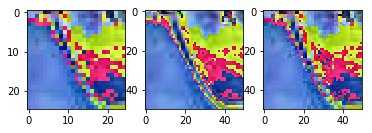

28500 [D loss: 0.695151, acc.: 41.00%] [G loss: 0.727962]


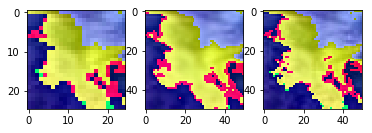

28600 [D loss: 0.694115, acc.: 43.50%] [G loss: 0.750547]


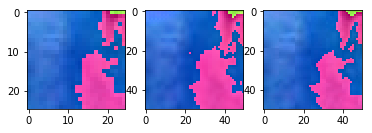

28700 [D loss: 0.694664, acc.: 43.50%] [G loss: 0.728625]


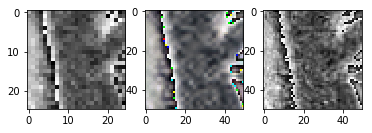

28800 [D loss: 0.697412, acc.: 41.25%] [G loss: 0.755509]


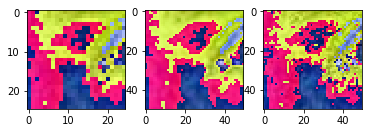

28900 [D loss: 0.694705, acc.: 51.00%] [G loss: 0.770990]


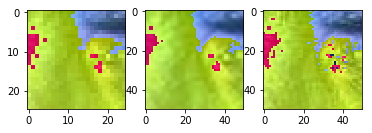

29000 [D loss: 0.695722, acc.: 41.75%] [G loss: 0.739799]


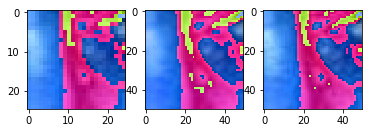

29100 [D loss: 0.694705, acc.: 47.75%] [G loss: 0.736401]


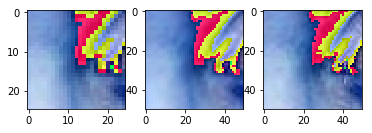

29200 [D loss: 0.694920, acc.: 42.00%] [G loss: 0.730837]


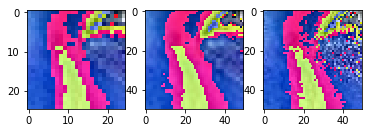

29300 [D loss: 0.694573, acc.: 40.00%] [G loss: 0.740934]


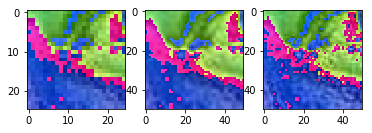

29400 [D loss: 0.694670, acc.: 46.00%] [G loss: 0.738613]


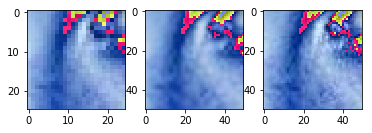

29500 [D loss: 0.694879, acc.: 36.00%] [G loss: 0.693139]


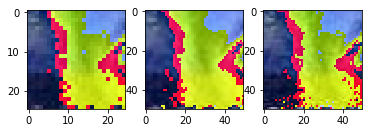

29600 [D loss: 0.691802, acc.: 51.25%] [G loss: 0.769063]


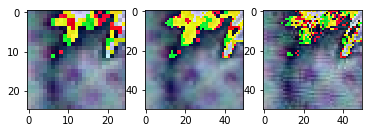

29700 [D loss: 0.700681, acc.: 39.25%] [G loss: 0.727089]


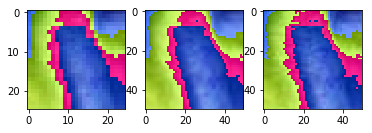

29800 [D loss: 0.694696, acc.: 41.50%] [G loss: 0.734662]


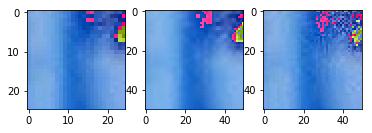

29900 [D loss: 0.694925, acc.: 43.00%] [G loss: 0.736255]


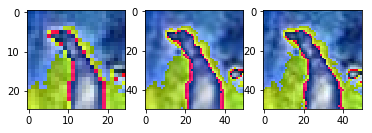

30000 [D loss: 0.695228, acc.: 40.50%] [G loss: 0.739986]


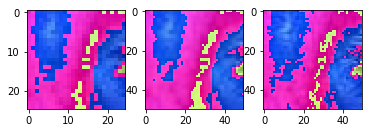

30100 [D loss: 0.695314, acc.: 47.00%] [G loss: 0.734129]


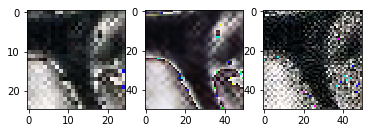

30200 [D loss: 0.695008, acc.: 40.25%] [G loss: 0.743792]


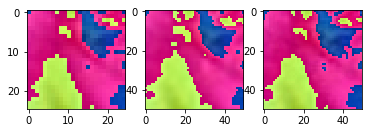

30300 [D loss: 0.694020, acc.: 47.00%] [G loss: 0.719361]


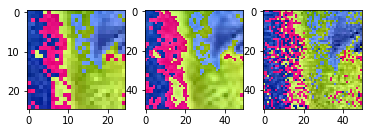

30400 [D loss: 0.696973, acc.: 45.25%] [G loss: 0.768977]


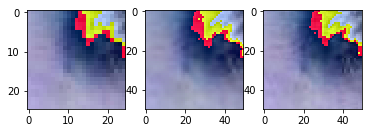

30500 [D loss: 0.694283, acc.: 41.75%] [G loss: 0.708913]


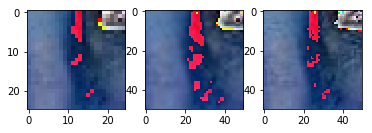

30600 [D loss: 0.696649, acc.: 38.00%] [G loss: 0.752281]


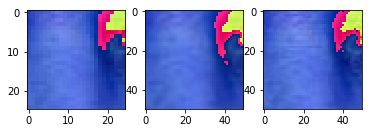

30700 [D loss: 0.696368, acc.: 48.75%] [G loss: 0.741063]


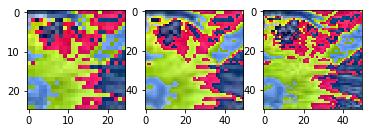

30800 [D loss: 0.694368, acc.: 43.00%] [G loss: 0.715888]


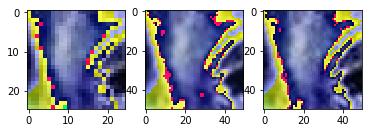

30900 [D loss: 0.696004, acc.: 46.25%] [G loss: 0.722653]


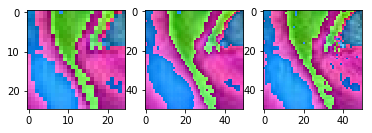

31000 [D loss: 0.695369, acc.: 44.50%] [G loss: 0.744012]


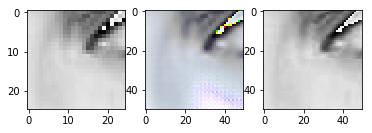

31100 [D loss: 0.694872, acc.: 40.50%] [G loss: 0.725343]


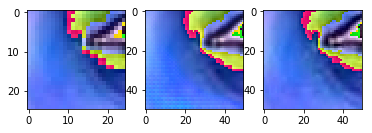

31200 [D loss: 0.694315, acc.: 51.25%] [G loss: 0.745838]


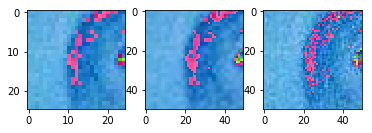

31300 [D loss: 0.693953, acc.: 48.50%] [G loss: 0.738833]


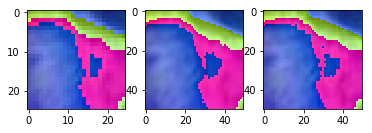

31400 [D loss: 0.694431, acc.: 50.00%] [G loss: 0.668241]


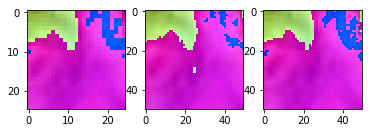

31500 [D loss: 0.696759, acc.: 50.00%] [G loss: 0.705804]


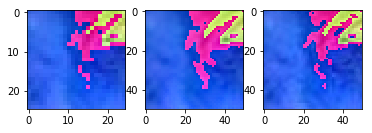

31600 [D loss: 0.697123, acc.: 43.00%] [G loss: 0.773963]


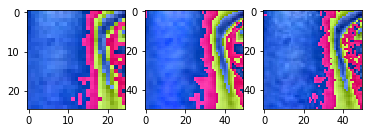

31700 [D loss: 0.695617, acc.: 47.75%] [G loss: 0.730730]


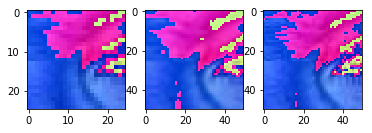

31800 [D loss: 0.694356, acc.: 44.00%] [G loss: 0.733300]


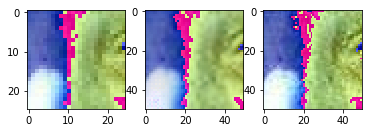

31900 [D loss: 0.696133, acc.: 44.00%] [G loss: 0.748308]


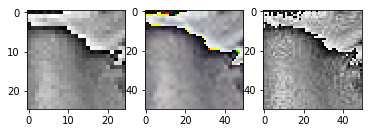

32000 [D loss: 0.695648, acc.: 41.25%] [G loss: 0.734764]


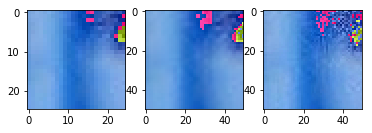

32100 [D loss: 0.695403, acc.: 45.50%] [G loss: 0.737979]


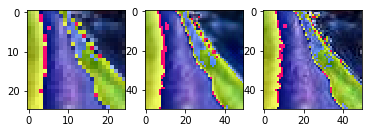

32200 [D loss: 0.695997, acc.: 50.25%] [G loss: 0.722865]


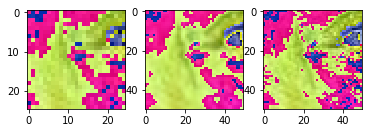

32300 [D loss: 0.695519, acc.: 46.00%] [G loss: 0.737596]


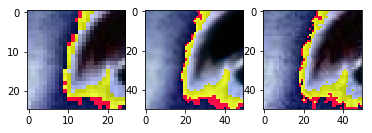

32400 [D loss: 0.695290, acc.: 47.50%] [G loss: 0.737150]


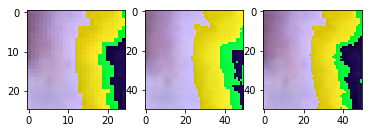

32500 [D loss: 0.694984, acc.: 41.75%] [G loss: 0.732240]


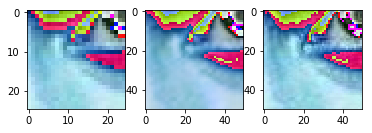

32600 [D loss: 0.694317, acc.: 49.50%] [G loss: 0.722850]


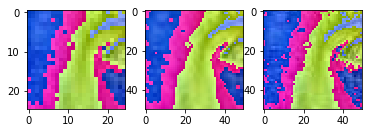

32700 [D loss: 0.695252, acc.: 41.25%] [G loss: 0.729384]


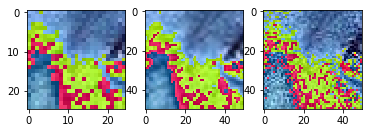

32800 [D loss: 0.694228, acc.: 42.75%] [G loss: 0.724909]


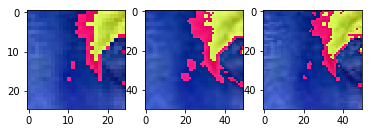

32900 [D loss: 0.694732, acc.: 43.75%] [G loss: 0.740451]


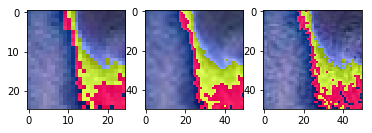

33000 [D loss: 0.694336, acc.: 47.25%] [G loss: 0.746808]


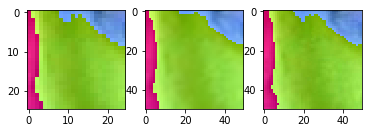

33100 [D loss: 0.694637, acc.: 41.75%] [G loss: 0.727671]


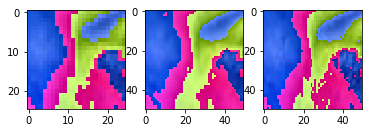

33200 [D loss: 0.694554, acc.: 44.00%] [G loss: 0.756366]


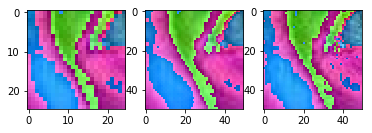

33300 [D loss: 0.694456, acc.: 46.00%] [G loss: 0.739986]


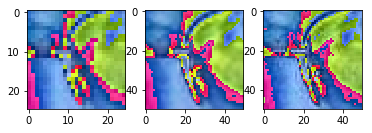

33400 [D loss: 0.694437, acc.: 48.00%] [G loss: 0.722073]


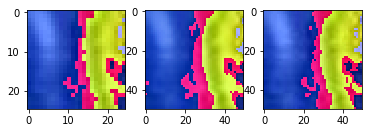

33500 [D loss: 0.694578, acc.: 46.25%] [G loss: 0.748965]


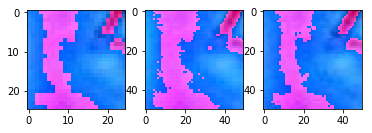

33600 [D loss: 0.694174, acc.: 39.00%] [G loss: 0.737763]


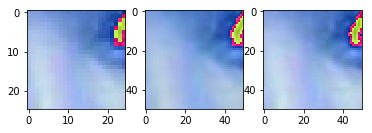

33700 [D loss: 0.694182, acc.: 47.00%] [G loss: 0.741421]


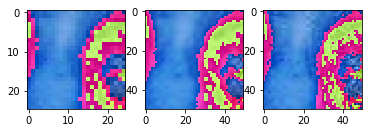

33800 [D loss: 0.695043, acc.: 45.00%] [G loss: 0.722028]


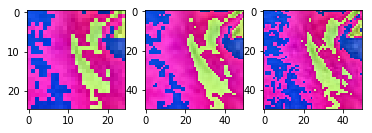

33900 [D loss: 0.694501, acc.: 48.50%] [G loss: 0.752010]


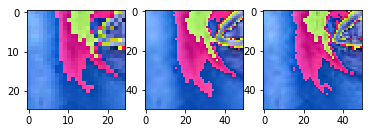

34000 [D loss: 0.695089, acc.: 49.75%] [G loss: 0.750552]


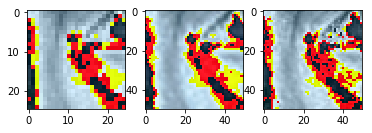

34100 [D loss: 0.695081, acc.: 41.50%] [G loss: 0.730750]


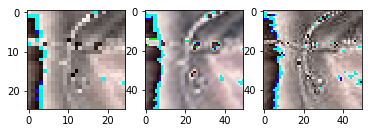

34200 [D loss: 0.693082, acc.: 51.25%] [G loss: 0.705005]


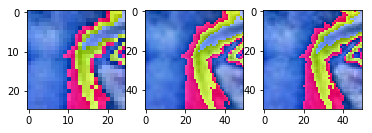

34300 [D loss: 0.695557, acc.: 37.00%] [G loss: 0.712698]


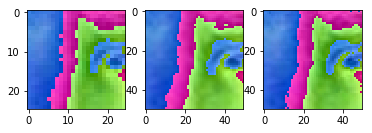

34400 [D loss: 0.694821, acc.: 50.25%] [G loss: 0.750081]


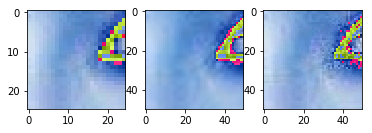

34500 [D loss: 0.698675, acc.: 49.25%] [G loss: 0.722352]


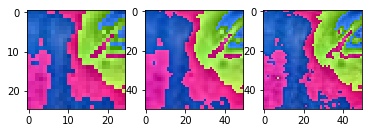

34600 [D loss: 0.694630, acc.: 46.00%] [G loss: 0.716205]


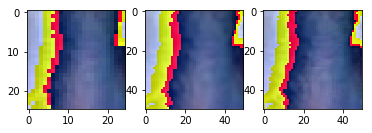

34700 [D loss: 0.696293, acc.: 43.00%] [G loss: 0.739094]


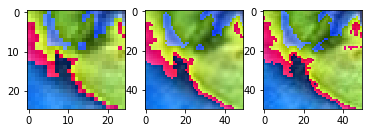

34800 [D loss: 0.696462, acc.: 44.25%] [G loss: 0.729762]


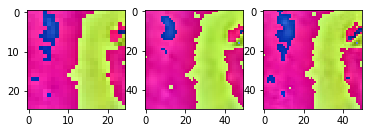

34900 [D loss: 0.694749, acc.: 43.75%] [G loss: 0.742897]


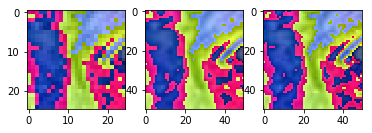

35000 [D loss: 0.695102, acc.: 39.00%] [G loss: 0.725957]


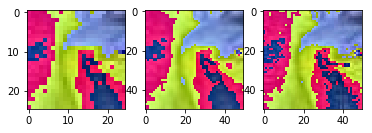

35100 [D loss: 0.694806, acc.: 44.25%] [G loss: 0.745721]


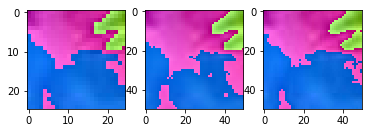

35200 [D loss: 0.695037, acc.: 45.50%] [G loss: 0.718864]


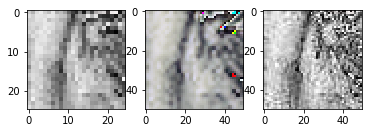

35300 [D loss: 0.695624, acc.: 38.75%] [G loss: 0.728071]


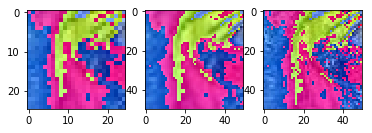

35400 [D loss: 0.694396, acc.: 45.00%] [G loss: 0.749908]


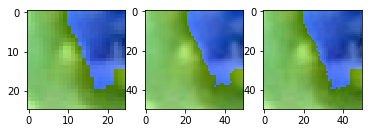

35500 [D loss: 0.695014, acc.: 46.25%] [G loss: 0.795296]


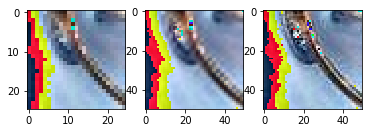

35600 [D loss: 0.694509, acc.: 47.00%] [G loss: 0.742481]


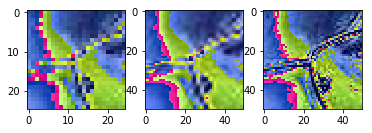

35700 [D loss: 0.695351, acc.: 45.00%] [G loss: 0.743211]


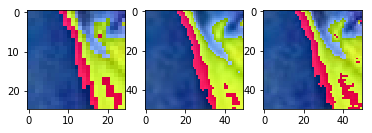

35800 [D loss: 0.692196, acc.: 48.00%] [G loss: 0.810580]


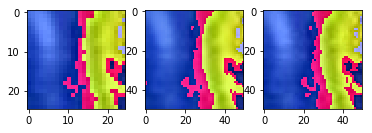

35900 [D loss: 0.693830, acc.: 51.00%] [G loss: 0.734000]


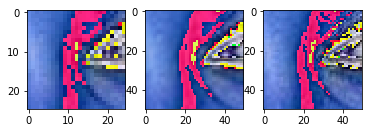

36000 [D loss: 0.696719, acc.: 48.50%] [G loss: 0.739813]


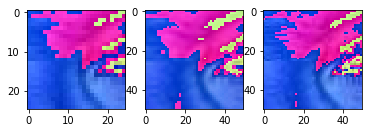

36100 [D loss: 0.696413, acc.: 42.50%] [G loss: 0.720046]


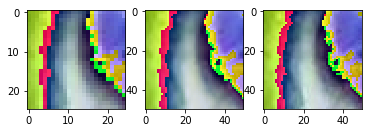

36200 [D loss: 0.697778, acc.: 43.50%] [G loss: 0.724529]


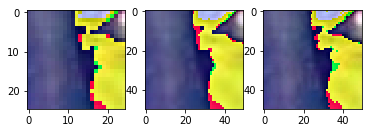

36300 [D loss: 0.695685, acc.: 41.75%] [G loss: 0.730472]


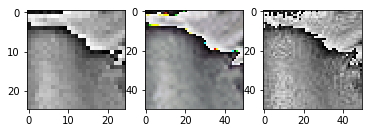

36400 [D loss: 0.695750, acc.: 43.75%] [G loss: 0.706743]


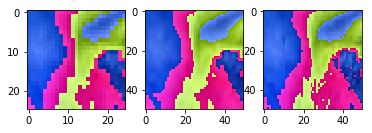

36500 [D loss: 0.696794, acc.: 43.75%] [G loss: 0.746753]


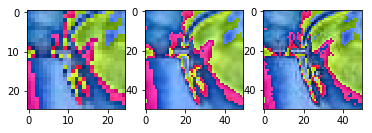

36600 [D loss: 0.695760, acc.: 46.50%] [G loss: 0.719759]


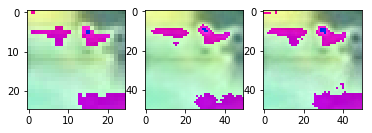

36700 [D loss: 0.696051, acc.: 43.75%] [G loss: 0.726291]


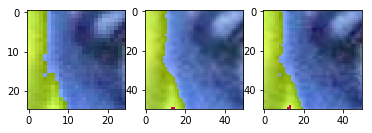

36800 [D loss: 0.696167, acc.: 46.75%] [G loss: 0.724434]


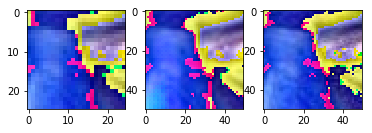

36900 [D loss: 0.694744, acc.: 44.50%] [G loss: 0.724258]


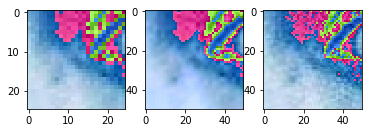

37000 [D loss: 0.695212, acc.: 45.00%] [G loss: 0.727131]


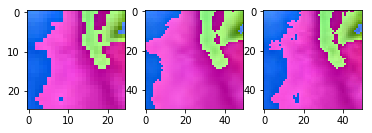

37100 [D loss: 0.691851, acc.: 49.75%] [G loss: 0.728544]


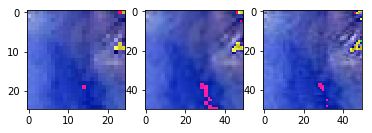

37200 [D loss: 0.698215, acc.: 45.00%] [G loss: 0.724507]


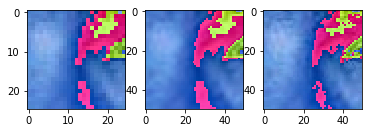

37300 [D loss: 0.696599, acc.: 46.00%] [G loss: 0.739258]


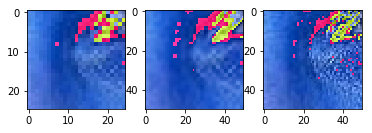

37400 [D loss: 0.695743, acc.: 43.50%] [G loss: 0.728170]


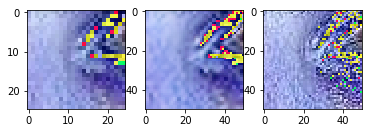

37500 [D loss: 0.695191, acc.: 46.25%] [G loss: 0.720876]


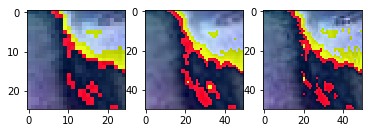

37600 [D loss: 0.695355, acc.: 43.75%] [G loss: 0.734774]


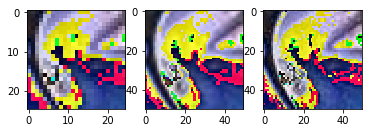

37700 [D loss: 0.695097, acc.: 50.50%] [G loss: 0.724157]


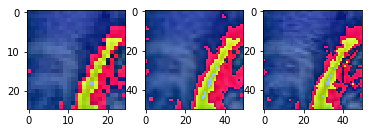

37800 [D loss: 0.695555, acc.: 44.00%] [G loss: 0.730215]


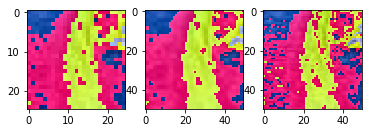

37900 [D loss: 0.694990, acc.: 44.75%] [G loss: 0.715533]


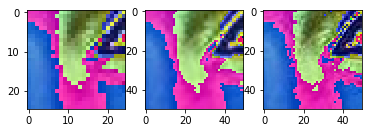

38000 [D loss: 0.694745, acc.: 45.50%] [G loss: 0.721853]


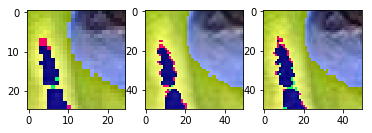

38100 [D loss: 0.694987, acc.: 47.00%] [G loss: 0.728649]


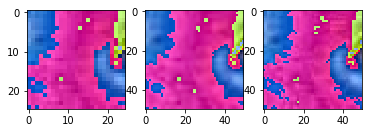

38200 [D loss: 0.693831, acc.: 50.25%] [G loss: 0.719752]


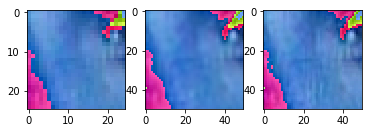

38300 [D loss: 0.697901, acc.: 41.50%] [G loss: 0.731027]


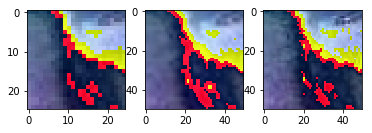

38400 [D loss: 0.694980, acc.: 47.00%] [G loss: 0.744088]


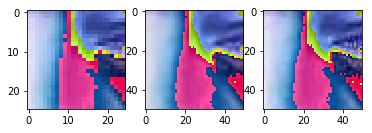

38500 [D loss: 0.695065, acc.: 46.50%] [G loss: 0.727227]


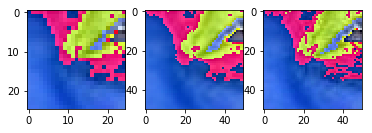

38600 [D loss: 0.694859, acc.: 53.00%] [G loss: 0.742762]


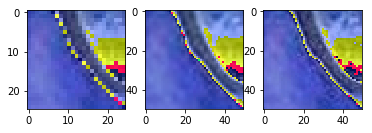

38700 [D loss: 0.695455, acc.: 43.75%] [G loss: 0.737575]


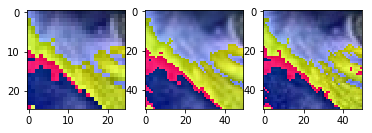

38800 [D loss: 0.694656, acc.: 42.00%] [G loss: 0.735797]


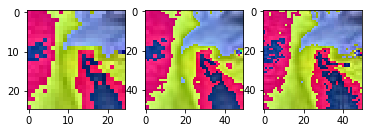

38900 [D loss: 0.694215, acc.: 46.50%] [G loss: 0.747828]


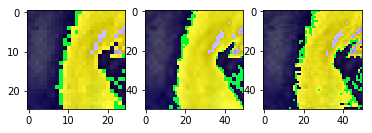

39000 [D loss: 0.694432, acc.: 48.75%] [G loss: 0.751832]


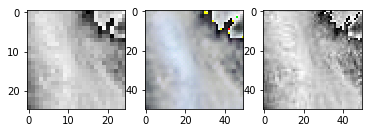

39100 [D loss: 0.695037, acc.: 46.25%] [G loss: 0.716101]


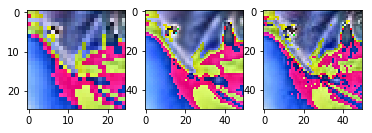

39200 [D loss: 0.695209, acc.: 42.75%] [G loss: 0.728029]


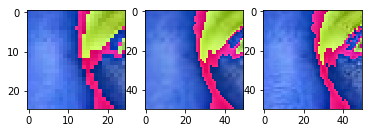

39300 [D loss: 0.694369, acc.: 34.75%] [G loss: 0.725732]


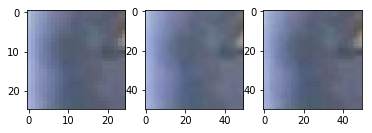

39400 [D loss: 0.694243, acc.: 42.75%] [G loss: 0.730881]


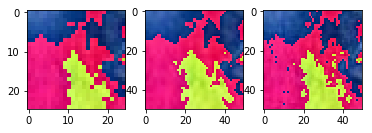

39500 [D loss: 0.694611, acc.: 45.50%] [G loss: 0.730025]


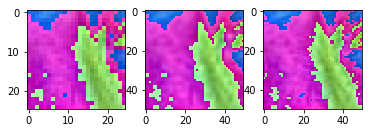

39600 [D loss: 0.694928, acc.: 43.75%] [G loss: 0.723859]


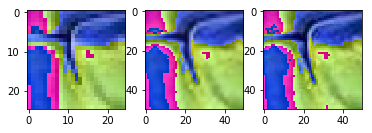

39700 [D loss: 0.694598, acc.: 46.50%] [G loss: 0.730271]


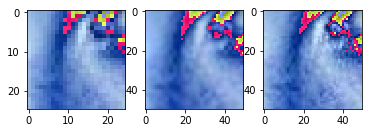

39800 [D loss: 0.694792, acc.: 42.75%] [G loss: 0.732047]


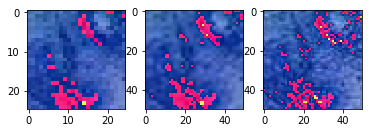

39900 [D loss: 0.694570, acc.: 44.25%] [G loss: 0.715340]


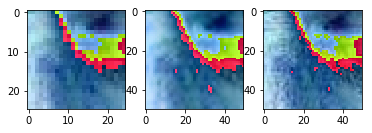

In [39]:
epochs = 40000
batch_size = 4
half_batch = int(batch_size/2)

# Altered for variable channel 3 size
def reduce_resolution(ims):
    O, M, N, P = ims.shape
    K = 2
    L = 2

    MK = M // K
    NL = N // L
    return ims.reshape(-1, MK, K, NL, L, P).mean(axis=(2, 4)).reshape(O, MK, NL, P)

def upsize(ims):
    return ims.repeat(2, axis = 1).repeat(2, axis = 2)

for epoch in range(epochs):
    ind = 6
    d = im_names[ind]
    path1 = path + dirs[ind] + "/"

    # ---------------------
    #  Train Discriminator
    # ---------------------

    # Select a random half batch of images
    idx = np.random.randint(0, len(d), half_batch)
    imgs = load_batch(path1, d, idx)
    noise = reduce_resolution(imgs)

    idx1 = np.random.randint(0, len(d), half_batch)
    imgs1 = load_batch(path1, d, idx1)
    noise1 = reduce_resolution(imgs1)

    # Generate a half batch of new images
    gen_imgs = generator.predict(noise1)
    # Train the discriminator
    
    d_loss_real = discriminator.train_on_batch([noise, imgs], np.ones((half_batch, 1)))
    d_loss_fake = discriminator.train_on_batch([noise1, gen_imgs], np.zeros((half_batch, 1)))
    d_loss += 0.5 * np.add(d_loss_real, d_loss_fake)

    # ---------------------
    #  Train Generator
    # ---------------------

    idx2 = np.random.randint(0, len(d), batch_size)
    ims2 = load_batch(path1, d, idx2)
    noise2 = reduce_resolution(ims2)

    # The generator wants the discriminator to label the generated samples
    # as valid (ones)
    valid_y = np.array([1] * batch_size)
    
    # Train the generator
    g_loss = combined.train_on_batch(noise2, [valid_y, ims2])
    
    plot_every = 100
    
    if epoch % plot_every == 0:
        # Plot the progress
        print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0]/plot_every, 100*d_loss[1]/plot_every, g_loss[0]))
        fig, ax = plt.subplots(1, 3)
        ax[0].imshow(noise1[0, 75:100, 100:125, :])
        ax[1].imshow(gen_imgs[0, 150:200, 200:250, :])
        ax[2].imshow(imgs1[0, 150:200, 200:250, :])
        plt.show()
        d_loss = [0, 0]


In [42]:
generator.save('./models/generator_faces60000.h5')
discriminator.save('./models/discriminator_faces60000.h5')
combined.save('./models/combined_faces60000.h5')

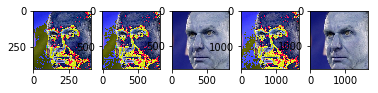

In [70]:
from PIL import Image
import PIL
n = 0
imgs3 = load_batch(path1, d, idx)
imx = Image.fromarray(np.array((imgs3[n]+1.)*255/2, dtype='uint8'))
imx2 = imx.resize((410*2, 410*2), resample=PIL.Image.BICUBIC)
imx4 = imx.resize((410*4, 410*4), resample=PIL.Image.BICUBIC)
HD = generator.predict(imgs3)
HD1 = generator.predict(np.expand_dims(HD[0], axis=0))
fig, ax = plt.subplots(1, 5)
ax[0].imshow(imgs3[n])
ax[1].imshow(HD[n])
ax[2].imshow(imx2)
ax[3].imshow(HD1[n])
ax[4].imshow(imx4)
plt.show()

In [43]:
import imageio
n=1
imageio.imwrite('./image_examples/gen_img60000.jpg', gen_imgs[n])
imageio.imwrite('./image_examples/input_img60000.jpg', noise1[n])
imageio.imwrite('./image_examples/original_img60000.jpg', imgs1[n])

C:\Users\Daniel\Anaconda3\lib\site-packages\imageio\core\util.py:104: UserWarning: Conversion from float32 to uint8, range [-0.9999971389770508, 0.9738192558288574]
  'range [{2}, {3}]'.format(dtype_str, out_type.__name__, mi, ma))
C:\Users\Daniel\Anaconda3\lib\site-packages\imageio\core\util.py:104: UserWarning: Conversion from float64 to uint8, range [-1.0, 1.0]
  'range [{2}, {3}]'.format(dtype_str, out_type.__name__, mi, ma))


In [71]:
imageio.imwrite('./image_examples/gen_img60000x2.jpg', HD[n])
imageio.imwrite('./image_examples/input_img60000x1.jpg', imgs3[n])
imageio.imwrite('./image_examples/gen_img60000x4.jpg', HD1[n])


imageio.imwrite('./image_examples/interpolatedx2.jpg', np.array(imx2))
imageio.imwrite('./image_examples/interpolatedx4.jpg', np.array(imx4))

C:\Users\Daniel\Anaconda3\lib\site-packages\imageio\core\util.py:104: UserWarning: Conversion from float32 to uint8, range [-0.9998878240585327, 0.9832291603088379]
  'range [{2}, {3}]'.format(dtype_str, out_type.__name__, mi, ma))
C:\Users\Daniel\Anaconda3\lib\site-packages\imageio\core\util.py:104: UserWarning: Conversion from float64 to uint8, range [-1.0, 1.0]
  'range [{2}, {3}]'.format(dtype_str, out_type.__name__, mi, ma))
C:\Users\Daniel\Anaconda3\lib\site-packages\imageio\core\util.py:104: UserWarning: Conversion from float32 to uint8, range [-1.0, 0.9582899808883667]
  'range [{2}, {3}]'.format(dtype_str, out_type.__name__, mi, ma))
